In [1]:
%cd ../..
file_paths = [
    "c_cluster_analysis/outputs/hints/mmlu/DeepSeek-R1-Distill-Llama-8B/confidence/none_unverb_5001.json",          # UNHINTED
    "c_cluster_analysis/outputs/hints/mmlu/DeepSeek-R1-Distill-Llama-8B/confidence/sycophancy_unverb_5001.json",          # UNHINTED
]
file_labels = ["unhinted", "hinted"]
hint_verification_path = (
    "data/mmlu/DeepSeek-R1-Distill-Llama-8B/sycophancy/hint_verification_with_500.json"
)

import json
from pathlib import Path
from collections import Counter, defaultdict
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

CATEGORIES = [
    "problem_restating",
    "knowledge_augmentation",
    "assumption_validation",
    "logical_deduction",
    "option_elimination",
    "uncertainty_or_certainty_expression",
    "backtracking",
    "forward_planning",
    "decision_confirmation",
    "answer_reporting",
    "option_restating",
    "other",
]

SKIP_FIELDS = {"sentence_id", "other_label"}

/Users/ifc24/Develop/CoTFaithChecker


/Users/ifc24/miniconda3/envs/neurenv/lib/python3.10/site-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [2]:
def top_category_per_sentence(sent_dict: dict[str, float]) -> str | None:
    best_cat, best_val = None, -1.0
    for cat, val in sent_dict.items():
        if cat in SKIP_FIELDS:
            continue
        if cat not in CATEGORIES:
            continue
        if val > best_val:
            best_cat, best_val = cat, val
    return best_cat if best_val > 0.0 else None

def count_top_categories(data, *, question_filter=None):
    counts = Counter({cat: 0 for cat in CATEGORIES})
    for q in data:
        if question_filter is not None and q["question_id"] not in question_filter:
            continue
        for sent in q["annotations"]:
            cat = top_category_per_sentence(sent)
            if cat:
                counts[cat] += 1
    return counts

def sum_confidence_categories(data, *, question_filter=None):
    sums = defaultdict(float, {cat: 0.0 for cat in CATEGORIES})
    for q in data:
        if question_filter is not None and q["question_id"] not in question_filter:
            continue
        for sent in q["annotations"]:
            for cat, val in sent.items():
                if cat in SKIP_FIELDS or cat not in CATEGORIES:
                    continue
                sums[cat] += val
    return Counter(sums)

def file_stats(data):
    n_q = len(data)
    n_sent = sum(len(q["annotations"]) for q in data)
    return n_q, n_sent

with Path(file_paths[0]).open() as fh:
    unhinted_data = json.load(fh)
    #print(unhinted_data.len)

with Path(file_paths[1]).open() as fh:
    hinted_data = json.load(fh)

with Path(hint_verification_path).open() as fh:
    hint_checks = json.load(fh)

unverbalized_qids = {
    item["question_id"]
    for item in hint_checks
    #if item.get("verbalizes_hint") is False
}

unhinted_qids = [q["question_id"] for q in unhinted_data]
hinted_qids = [
    q["question_id"] for q in hinted_data
    #if q["question_id"] in unverbalized_qids
]

print(f"unhinted ({len(unhinted_qids)}):", unhinted_qids)
print(f"hinted   ({len(hinted_qids)}):", hinted_qids)

common_qids = set(unhinted_qids) & set(hinted_qids)
print("common to both conditions:", sorted(common_qids))

unhinted (200): [68, 75, 81, 94, 104, 110, 130, 148, 158, 195, 197, 207, 234, 246, 248, 255, 311, 312, 318, 338, 380, 400, 451, 472, 474, 479, 480, 492, 510, 514, 534, 541, 544, 581, 620, 657, 659, 667, 671, 709, 716, 730, 734, 737, 742, 763, 776, 793, 803, 810, 838, 851, 855, 856, 872, 885, 950, 951, 952, 1033, 1045, 1076, 1080, 1120, 1132, 1147, 1151, 1153, 1164, 1171, 1172, 1205, 1212, 1213, 1218, 1233, 1247, 1255, 1256, 1261, 1270, 1293, 1308, 1311, 1312, 1325, 1327, 1347, 1354, 1380, 1403, 1419, 1439, 1440, 1443, 1463, 1467, 1485, 1495, 1498, 1509, 1536, 1556, 1562, 1594, 1606, 1612, 1680, 1686, 1735, 1770, 1775, 1776, 1789, 1810, 1839, 1860, 1878, 1883, 1916, 1924, 1932, 1937, 1943, 1990, 1992, 2019, 2048, 2060, 2214, 2218, 2247, 2302, 2357, 2458, 2507, 2558, 2598, 2606, 2627, 2640, 2663, 2710, 2713, 2824, 2842, 2884, 2901, 2904, 2909, 2910, 2915, 2925, 2929, 3254, 3260, 3274, 3366, 3455, 3478, 3539, 3555, 3559, 3638, 3653, 3720, 3748, 3750, 3756, 3794, 3814, 3824, 3894, 3948, 40

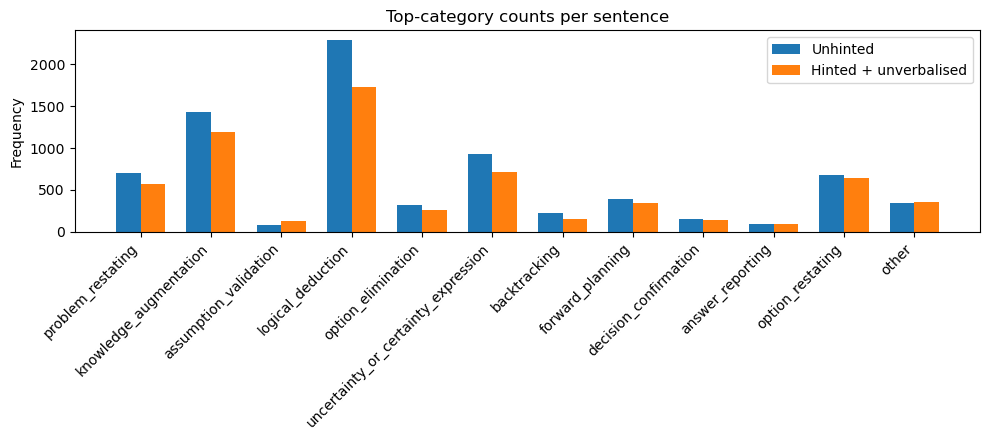

In [3]:
NORMALISATION = "per_sentence"

def normaliser(raw_counts, *, n_questions, n_sentences):
    if NORMALISATION == "none":
        return 1
    if NORMALISATION == "percent":
        total = sum(raw_counts.values())
        return total if total else 1
    if NORMALISATION == "per_question":
        return n_questions if n_questions else 1
    if NORMALISATION == "per_sentence":
        return n_sentences if n_sentences else 1
    raise ValueError(f"Unknown NORMALISATION: {NORMALISATION}")


counts_unhinted = count_top_categories(unhinted_data)
counts_hinted   = count_top_categories(hinted_data)#, question_filter=unverbalized_qids)

freq_df = pd.DataFrame({
    "category": CATEGORIES,
    "unhinted": [counts_unhinted[c] for c in CATEGORIES],
    "hinted_unverbalized": [counts_hinted[c] for c in CATEGORIES],
})

x = np.arange(len(CATEGORIES))
width = 0.35
fig, ax = plt.subplots(figsize=(10, 4.5))
ax.bar(x - width/2, freq_df["unhinted"],            width, label="Unhinted")
ax.bar(x + width/2, freq_df["hinted_unverbalized"], width, label="Hinted + unverbalised")
ax.set_ylabel("Frequency")
ax.set_title("Top-category counts per sentence")
ax.set_xticks(x)
ax.set_xticklabels(CATEGORIES, rotation=45, ha="right")
ax.legend()
plt.tight_layout()
plt.show()

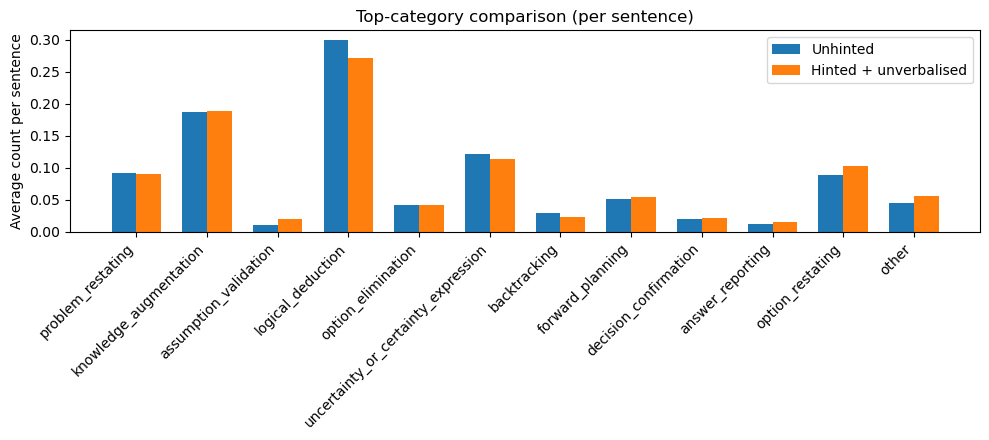

In [4]:
nq_unh, ns_unh = file_stats(unhinted_data)
nq_hin, ns_hin = file_stats(hinted_data)
div_unh = normaliser(counts_unhinted, n_questions=nq_unh, n_sentences=ns_unh)
div_hin = normaliser(counts_hinted,   n_questions=nq_hin, n_sentences=ns_hin)

freq_df_norm = pd.DataFrame({
    "category": CATEGORIES,
    "unhinted":           [counts_unhinted[c] / div_unh for c in CATEGORIES],
    "hinted_unverbalized":[counts_hinted[c]   / div_hin for c in CATEGORIES],
})

if NORMALISATION == "percent":
    freq_df_norm[["unhinted", "hinted_unverbalized"]] *= 100

ylabel = {
    "none":            "Raw frequency",
    "percent":         "Share of all top-category tokens (%)",
    "per_question":    "Average per question",
    "per_sentence":    "Average count per sentence",
}[NORMALISATION]

fig, ax = plt.subplots(figsize=(10, 4.5))
ax.bar(x - width/2, freq_df_norm["unhinted"],            width, label="Unhinted")
ax.bar(x + width/2, freq_df_norm["hinted_unverbalized"], width, label="Hinted + unverbalised")
ax.set_ylabel(ylabel)
ax.set_title(f"Top-category comparison ({NORMALISATION.replace('_',' ')})")
ax.set_xticks(x)
ax.set_xticklabels(CATEGORIES, rotation=45, ha="right")
ax.legend()
plt.tight_layout()
plt.show()

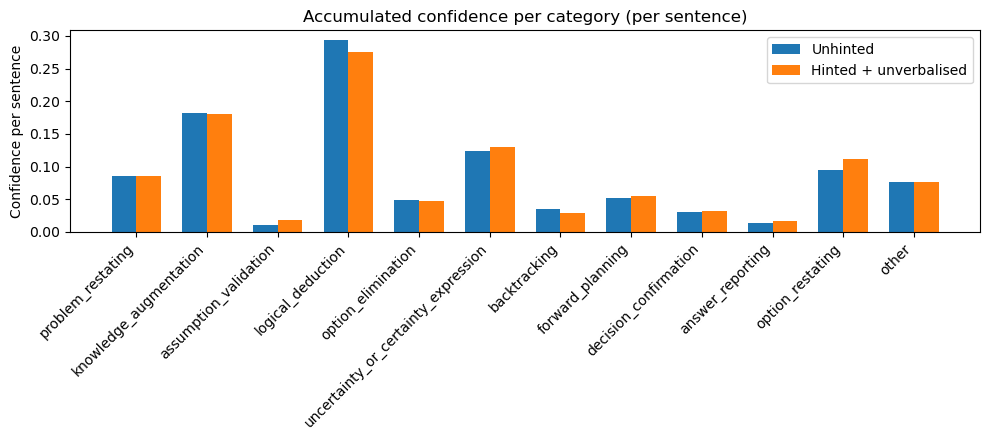

In [5]:
sum_unhinted = sum_confidence_categories(unhinted_data)
sum_hinted   = sum_confidence_categories(hinted_data)#, question_filter=unverbalized_qids)

sum_df_norm = pd.DataFrame({
    "category": CATEGORIES,
    "unhinted":           [sum_unhinted[c] / normaliser(sum_unhinted, n_questions=nq_unh, n_sentences=ns_unh) for c in CATEGORIES],
    "hinted_unverbalized":[sum_hinted[c]   / normaliser(sum_hinted,   n_questions=nq_hin, n_sentences=ns_hin) for c in CATEGORIES],
})

if NORMALISATION == "percent":
    sum_df_norm[["unhinted", "hinted_unverbalized"]] *= 100

ylabel_conf = {
    "none":            "Raw confidence sum",
    "percent":         "Share of total confidence (%)",
    "per_question":    "Confidence per question",
    "per_sentence":    "Confidence per sentence",
}[NORMALISATION]

fig, ax = plt.subplots(figsize=(10, 4.5))
ax.bar(x - width/2, sum_df_norm["unhinted"],            width, label="Unhinted")
ax.bar(x + width/2, sum_df_norm["hinted_unverbalized"], width, label="Hinted + unverbalised")
ax.set_ylabel(ylabel_conf)
ax.set_title(f"Accumulated confidence per category ({NORMALISATION.replace('_',' ')})")
ax.set_xticks(x)
ax.set_xticklabels(CATEGORIES, rotation=45, ha="right")
ax.legend()
plt.tight_layout()
plt.show()


X^2 = 241.9  |  dof = 135  |  p-value = 4.552e-08


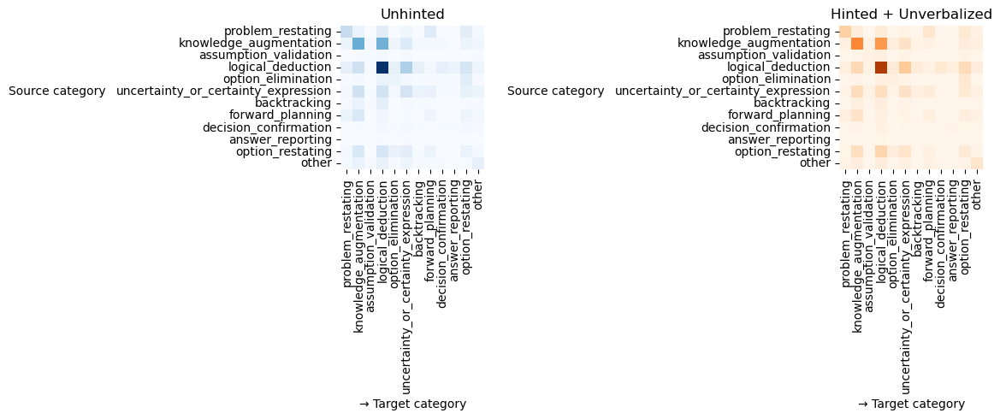


Top 10 absolute d (% points):
logical_deduction      → logical_deduction      : dow 2.09 pp
logical_deduction      → option_restating       : up 0.78 pp
uncertainty_or_certainty_expression → logical_deduction      : dow 0.76 pp
other                  → other                  : up 0.68 pp
logical_deduction      → backtracking           : dow 0.49 pp
logical_deduction      → knowledge_augmentation : dow 0.46 pp
uncertainty_or_certainty_expression → uncertainty_or_certainty_expression : dow 0.43 pp
logical_deduction      → problem_restating      : dow 0.42 pp
uncertainty_or_certainty_expression → option_restating       : up 0.42 pp
problem_restating      → logical_deduction      : dow 0.38 pp


In [8]:
# transition analysis

# taking vars
# ─ unhinted_data + hinted_data
# ─ unverbalized_qids - question_ids allowed in hinted set
# ─ CATEGORIES - ordered list of the 9 category strings
#
# time-step: one sentence! for every consecutive pair S1->S2
# 1 taking labels S1, taking labels S2, 
# 2 cartesian product S1 x S2 -> |S1| x |S2| directed edges
# -> + self-edges like log_deduct->log_deduct show how often same mode
# 3 counting every (S1, S2) edge - storing in 9x9 matrix
# + normalising!

from collections import Counter
from itertools import pairwise
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import chi2_contingency
from itertools import pairwise

TRANS_NORM = "percent"

from itertools import pairwise

# getting labels - only top or all
def sentence_labels(sent_dict, *, mode="top"):
    if mode == "top":
        cat = top_category_per_sentence(sent_dict)
        return [cat] if cat else []

    if mode == "nonzero":
        return [
            c for c in CATEGORIES
            if c not in SKIP_FIELDS and sent_dict.get(c, 0.0) > 0.0
        ]

    raise ValueError("mode must be 'top' or 'nonzero'")

# 'edge' is specific transition - count of how often it occurs
def collect_edges(data, *, question_filter=None, label_mode="top"):
    edges = Counter()
    total = 0

    # skip unless they're in the filter (which is rn off)
    for q in data:
        if question_filter is not None and q["question_id"] not in question_filter:
            continue

        # one question: sorting sentences by ID
        ordered_sents = sorted(q["annotations"], key=lambda s: s["sentence_id"])

        # each sentence gets a cat
        for cur, nxt in pairwise(ordered_sents):
            src_labels = sentence_labels(cur, mode=label_mode)
            tgt_labels = sentence_labels(nxt, mode=label_mode)

            # cartesian prod - count all possible transitions
            for s in src_labels:
                for t in tgt_labels:
                    edges[(s, t)] += 1
                    total += 1

    return edges, total

# edge count -> 12x12 transition matrix as pandas.DataFrame
def edges_to_matrix(counter, *, normalise=None, total_edges=None):

    # creating matrix - row src, col tgt - initially 0, naming
    mat = pd.DataFrame(0, index=CATEGORIES, columns=CATEGORIES, dtype=float)

    # filling cells with # transitions
    for (s, t), n in counter.items():
        mat.loc[s, t] = n

    if normalise == "percent":
        mat = (mat / total_edges) * 100
    elif normalise == "row":
        mat = mat.div(mat.sum(axis=1).replace(0, np.nan), axis=0)
    # "none" keeps raw counts
    return mat

edges_unh, total_unh = collect_edges(unhinted_data)
edges_hin, total_hin = collect_edges(hinted_data)#, question_filter=unverbalized_qids)

M_unh = edges_to_matrix(edges_unh, normalise=TRANS_NORM, total_edges=total_unh)
M_hin = edges_to_matrix(edges_hin, normalise=TRANS_NORM, total_edges=total_hin)
M_diff = M_hin - M_unh

# x2
contingency = np.vstack([
    M_unh.values.flatten() if TRANS_NORM == "none" else
    (np.array([edges_unh.get((r, c), 0) for r in CATEGORIES for c in CATEGORIES])),
    M_hin.values.flatten() if TRANS_NORM == "none" else
    (np.array([edges_hin.get((r, c), 0) for r in CATEGORIES for c in CATEGORIES]))
])
nonzero_mask = contingency.sum(axis=0) > 0
contingency   = contingency[:, nonzero_mask] 
chi2, p_value, dof, exp = chi2_contingency(contingency)
print(f"X^2 = {chi2:,.1f}  |  dof = {dof}  |  p-value = {p_value:.4g}")

#fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
vmax = max(M_unh.max().max(), M_hin.max().max())
sns.heatmap(M_unh, ax=axes[0], vmin=0, vmax=vmax, cmap="Blues", cbar=False, square=True)
axes[0].set_title("Unhinted")
sns.heatmap(M_hin, ax=axes[1], vmin=0, vmax=vmax, cmap="Oranges", cbar=False, square=True)
axes[1].set_title("Hinted + Unverbalized")
#sns.heatmap(M_diff, ax=axes[2], center=0, cmap="coolwarm", cbar_kws={"label": "Δ (Hinted – Unhinted)"}, square=True, fmt=".2f", annot=True)
#axes[2].set_title("Difference")

for ax in axes:
    ax.set_xlabel("→ Target category")
    ax.set_ylabel("Source category", rotation=0, labelpad=50)
plt.tight_layout()
plt.show()

print("\nTop 10 absolute d (% points):")
diff_series = M_diff.unstack().sort_values(key=np.abs, ascending=False)
for (src, tgt), delta in diff_series.head(10).items():
    sign = "up" if delta > 0 else "dow"
    print(f"{src:22s} → {tgt:22s} : {sign}{abs(delta):5.2f} pp")


In [7]:
#!pip install -q seaborn

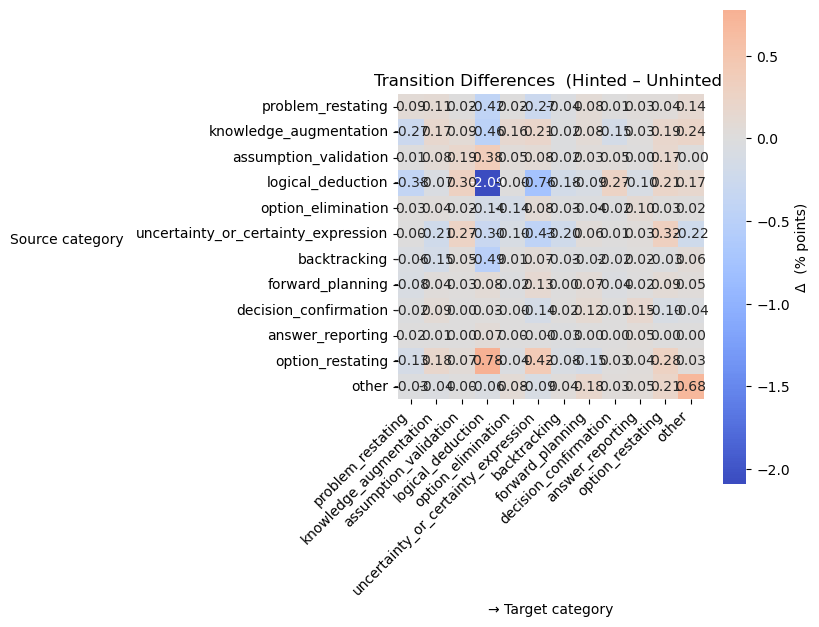

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 7))
sns.heatmap(M_diff, center=0, cmap="coolwarm",
            square=True, annot=True, fmt=".2f",
            cbar_kws={"label": "Δ  (% points)"})
plt.title("Transition Differences  (Hinted – Unhinted)")
plt.xlabel("→ Target category")
plt.ylabel("Source category", rotation=0, labelpad=50)
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()


X^2 = 204.6  |  dof = 123  |  p-value = 5.392e-06


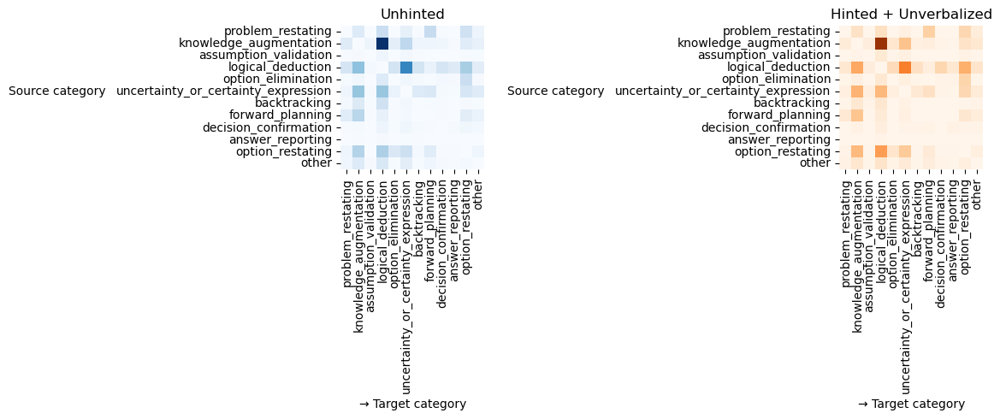


Top 10 absolute d (% points):
uncertainty_or_certainty_expression → logical_deduction      : dow 1.17 pp
logical_deduction      → option_restating       : up 1.05 pp
logical_deduction      → knowledge_augmentation : dow 0.79 pp
logical_deduction      → backtracking           : dow 0.72 pp
logical_deduction      → problem_restating      : dow 0.62 pp
problem_restating      → logical_deduction      : dow 0.56 pp
uncertainty_or_certainty_expression → option_restating       : up 0.55 pp
logical_deduction      → assumption_validation  : up 0.53 pp
logical_deduction      → uncertainty_or_certainty_expression : dow 0.48 pp
option_restating       → uncertainty_or_certainty_expression : up 0.42 pp


In [10]:
# edges to themselves as one

TRANS_NORM = "percent"

from itertools import pairwise

def sentence_labels(sent_dict, *, mode="top"):
    if mode == "top":
        cat = top_category_per_sentence(sent_dict)
        return [cat] if cat else []

    if mode == "nonzero":
        return [
            c for c in CATEGORIES
            if c not in SKIP_FIELDS and sent_dict.get(c, 0.0) > 0.0
        ]

    raise ValueError("mode must be 'top' or 'nonzero'")


def collect_edges(data, *, question_filter=None, label_mode="top"):
    edges = Counter()
    total = 0

    for q in data:
        if question_filter is not None and q["question_id"] not in question_filter:
            continue

        ordered = sorted(q["annotations"], key=lambda s: s["sentence_id"])

        prev_labels = None
        for sent in ordered:
            curr_labels = sentence_labels(sent, mode=label_mode)

            if prev_labels is None:
                prev_labels = curr_labels
                continue

            for s in prev_labels:
                for t in curr_labels:
                    if s == t:
                        continue
                    edges[(s, t)] += 1
                    total += 1
            prev_labels = curr_labels
    return edges, total

def edges_to_matrix(counter, *, normalise=None, total_edges=None):
    mat = pd.DataFrame(0, index=CATEGORIES, columns=CATEGORIES, dtype=float)
    for (s, t), n in counter.items():
        mat.loc[s, t] = n

    if normalise == "percent":
        mat = (mat / total_edges) * 100
    elif normalise == "row":
        mat = mat.div(mat.sum(axis=1).replace(0, np.nan), axis=0)
    return mat

edges_unh, total_unh = collect_edges(unhinted_data)
edges_hin, total_hin = collect_edges(hinted_data)#, question_filter=unverbalized_qids)

M_unh = edges_to_matrix(edges_unh, normalise=TRANS_NORM, total_edges=total_unh)
M_hin = edges_to_matrix(edges_hin, normalise=TRANS_NORM, total_edges=total_hin)
M_diff = M_hin - M_unh

# x2
contingency = np.vstack([
    M_unh.values.flatten() if TRANS_NORM == "none" else
    (np.array([edges_unh.get((r, c), 0) for r in CATEGORIES for c in CATEGORIES])),
    M_hin.values.flatten() if TRANS_NORM == "none" else
    (np.array([edges_hin.get((r, c), 0) for r in CATEGORIES for c in CATEGORIES]))
])
nonzero_mask = contingency.sum(axis=0) > 0
contingency   = contingency[:, nonzero_mask] 
chi2, p_value, dof, exp = chi2_contingency(contingency)
print(f"X^2 = {chi2:,.1f}  |  dof = {dof}  |  p-value = {p_value:.4g}")

#fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
vmax = max(M_unh.max().max(), M_hin.max().max())
sns.heatmap(M_unh, ax=axes[0], vmin=0, vmax=vmax, cmap="Blues", cbar=False, square=True)
axes[0].set_title("Unhinted")
sns.heatmap(M_hin, ax=axes[1], vmin=0, vmax=vmax, cmap="Oranges", cbar=False, square=True)
axes[1].set_title("Hinted + Unverbalized")
#sns.heatmap(M_diff, ax=axes[2], center=0, cmap="coolwarm", cbar_kws={"label": "Δ (Hinted – Unhinted)"}, square=True, fmt=".2f", annot=True)
#axes[2].set_title("Difference")

for ax in axes:
    ax.set_xlabel("→ Target category")
    ax.set_ylabel("Source category", rotation=0, labelpad=50)
plt.tight_layout()
plt.show()

print("\nTop 10 absolute d (% points):")
diff_series = M_diff.unstack().sort_values(key=np.abs, ascending=False)
for (src, tgt), delta in diff_series.head(10).items():
    sign = "up" if delta > 0 else "dow"
    print(f"{src:22s} → {tgt:22s} : {sign}{abs(delta):5.2f} pp")


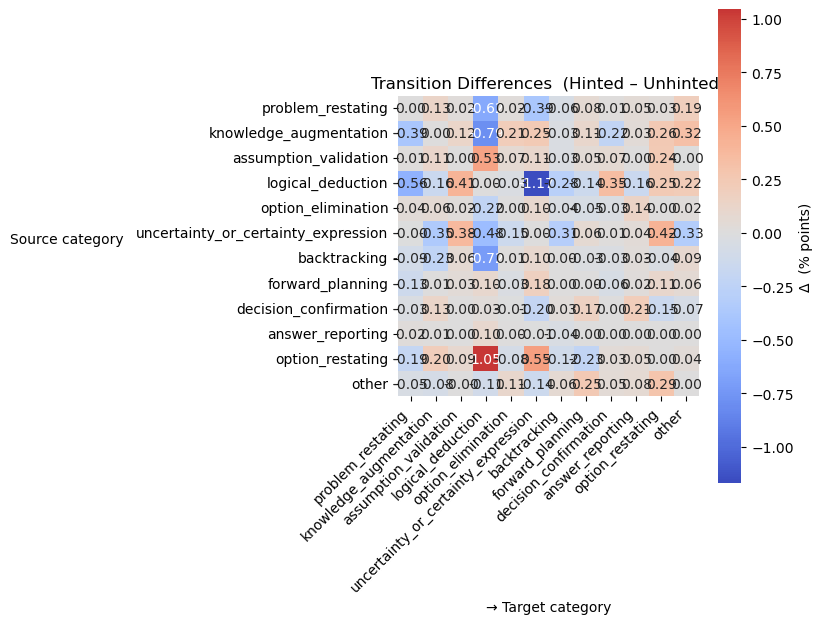

In [11]:
plt.figure(figsize=(8, 7))
sns.heatmap(M_diff, center=0, cmap="coolwarm",
            square=True, annot=True, fmt=".2f",
            cbar_kws={"label": "Δ  (% points)"})
plt.title("Transition Differences  (Hinted – Unhinted)")
plt.xlabel("→ Target category")
plt.ylabel("Source category", rotation=0, labelpad=50)
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()


In [11]:
import plotly.graph_objects as go
"""
!pip install plotly
pip install --upgrade nbformat
"""

def collect_links(matrix, thresh):
    src, tgt, val = [], [], []
    for i, s in enumerate(CATEGORIES):
        for j, t in enumerate(CATEGORIES):
            v = matrix.loc[s, t]
            if v >= thresh:
                src.append(i)
                tgt.append(j)
                val.append(v)
    return src, tgt, val

THRESH = 1.0
COL_UNH = "rgba(31,119,180,0.50)"
COL_HIN = "rgba(255,127,14,0.50)"
W, H   = 800, 500

src_u, tgt_u, val_u = collect_links(M_unh, THRESH)
src_h, tgt_h, val_h = collect_links(M_hin, THRESH)

sources  = src_u + src_h
targets  = tgt_u + tgt_h
values   = val_u + val_h
colours  = [COL_UNH]*len(val_u) + [COL_HIN]*len(val_h)

fig = go.Figure(data=[go.Sankey(arrangement="fixed",node=dict(label=CATEGORIES, pad=15, thickness=15),
    link=dict(source=sources, target=targets, value=values, color=colours))])

fig.update_layout(title_text="Category-to-Category Flow\nBlue = Unhinted, Orange = Hinted (+ Unverbalized)",
    width=W, height=H, font_size=12, margin=dict(t=80))
fig.show()


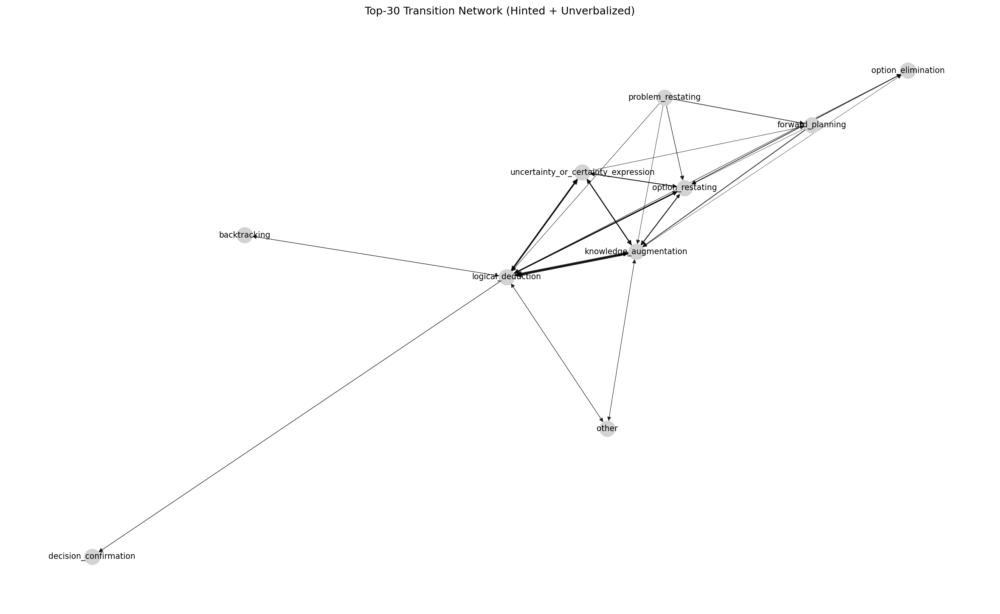

In [12]:
import matplotlib.pyplot as plt
import networkx as nx

TOP = 30
top_edges = sorted(edges_hin.items(),
                   key=lambda kv: kv[1],
                   reverse=True)[:TOP]

G = nx.DiGraph()
for (src, tgt), w in top_edges:
    G.add_edge(src, tgt, weight=w)

pos = nx.spring_layout(G, k=1.2, seed=42)

fig, ax = plt.subplots(figsize=(20, 12), dpi=150)

nx.draw_networkx_nodes(G, pos,
                       node_size=300,
                       node_color="lightgrey",
                       ax=ax)
nx.draw_networkx_labels(G, pos, font_size=9, ax=ax)

weights = [G[u][v]['weight'] for u, v in G.edges()] or [1]
max_w   = max(weights)
widths  = [3 * w / max_w for w in weights]

nx.draw_networkx_edges(G, pos,
                       arrows=True,
                       width=widths,
                       alpha=0.8,
                       ax=ax)

ax.set_title("Top-30 Transition Network (Hinted + Unverbalized)")
ax.axis("off")
plt.show()


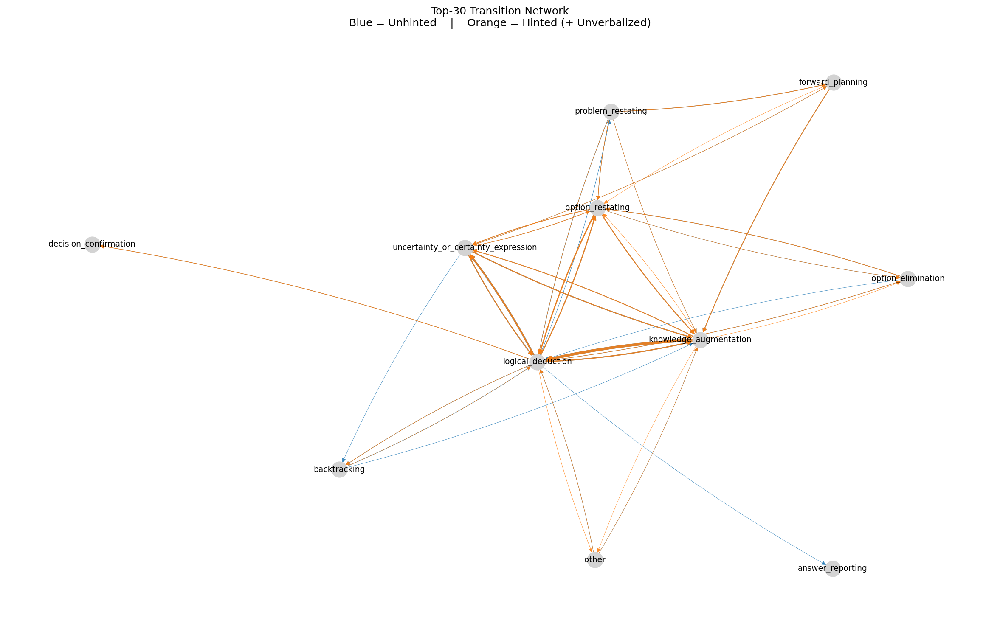

In [13]:
import matplotlib.pyplot as plt
import networkx as nx

TOP = 30
top_unh = sorted(edges_unh.items(),
                 key=lambda kv: kv[1],
                 reverse=True)[:TOP]
top_hin = sorted(edges_hin.items(),
                 key=lambda kv: kv[1],
                 reverse=True)[:TOP]
G = nx.DiGraph()

for (src, tgt), w in top_unh:
    G.add_edge(src, tgt, weight_unh=w)

for (src, tgt), w in top_hin:
    if G.has_edge(src, tgt):
        G[src][tgt]["weight_hin"] = w
    else:
        G.add_edge(src, tgt, weight_hin=w)

pos = nx.spring_layout(G, k=1.2, seed=42)

fig, ax = plt.subplots(figsize=(20, 12), dpi=150)

nx.draw_networkx_nodes(G, pos,
                       node_size=300,
                       node_color="lightgrey",
                       ax=ax)
nx.draw_networkx_labels(G, pos, font_size=9, ax=ax)

def draw_edges(attr_key, color):
    elist   = [(u, v) for u, v, d in G.edges(data=True) if attr_key in d]
    if not elist:
        return
    weights = [G[u][v][attr_key] for u, v in elist]
    max_w   = max(weights)
    widths  = [3 * w / max_w for w in weights]

    nx.draw_networkx_edges(G, pos, edgelist=elist, arrows=True, width=widths,
        edge_color=color, alpha=0.85, connectionstyle="arc3,rad=0.05", ax=ax
    )

draw_edges("weight_unh", color="#1f77b4")
draw_edges("weight_hin", color="#ff7f0e")

ax.set_title("Top-30 Transition Network\nBlue = Unhinted    |    Orange = Hinted (+ Unverbalized)")
ax.axis("off")
plt.show()


In [14]:
assert all(q["question_id"] in unverbalized_qids
           #for q in hinted_data), "filter leaked!"
           for q in hinted_data if q["question_id"] in unverbalized_qids), "filter leaked!"

print("Σ(M_unh)  =",   M_unh.values.sum().round(6))
print("Σ(M_hin)  =",   M_hin.values.sum().round(6))

delta_check = (M_hin - M_unh) - M_diff
assert np.allclose(delta_check.values, 0), "diff matrix mismatch!"


Σ(M_unh)  = 100.0
Σ(M_hin)  = 100.0


In [15]:
N_unh = total_unh
N_hin = total_hin
N_tot = N_unh + N_hin
phi    = np.sqrt(chi2 / N_tot)

print(f"Total transitions  Unhinted={N_unh:,}  Hinted={N_hin:,}")
print(f"(Cramer's V)     = {phi:.3f}")


Total transitions  Unhinted=5,212  Hinted=4,358
(Cramer's V)     = 0.146


In [16]:
from itertools import pairwise, product
from sklearn.feature_extraction import DictVectorizer

verbalized_qids = {d["question_id"] for d in hint_checks if d.get("verbalizes_hint", False)}
unverbalized_qids = {d["question_id"] for d in hint_checks if not d.get("verbalizes_hint", False)}

print(f"{len(verbalized_qids)=}  |  {len(unverbalized_qids)=}")

label_map = {qid: 1 for qid in verbalized_qids}
label_map.update({qid: 0 for qid in unverbalized_qids})

def build_feature_vector(annots, *, use_bigrams=True):
    cats = [top_category_per_sentence(s) for s in sorted(annots, key=lambda s: s["sentence_id"])]
    cats = [c for c in cats if c]
    feats = Counter(cats)                               # unigram counts  (e.g. "logical_deduction": 3)
    
    if use_bigrams and len(cats) > 1:
        feats.update({f"BIGRAM::{a}→{b}": 1 
                      for a, b in pairwise(cats)})      # binary bigram presence
    
    # include sequence length
    feats["SEQ_LEN"] = len(cats)
    return feats

X_dict, y, qids = [], [], []
for q in hinted_data:
    qid = q["question_id"]
    if qid not in label_map:
        continue
    
    X_dict.append(build_feature_vector(q["annotations"], use_bigrams=True))
    y.append(label_map[qid])
    qids.append(qid)

print(f"Dataset shape: {len(X_dict)} questions, {sum(map(len, X_dict))/len(X_dict):.1f} features (avg)")

# vectorise to a numeric matrix
vec = DictVectorizer(sparse=True)
X   = vec.fit_transform(X_dict)
feature_names = np.array(vec.get_feature_names_out())


len(verbalized_qids)=55  |  len(unverbalized_qids)=22
Dataset shape: 10 questions, 28.2 features (avg)


              precision    recall  f1-score   support

           0      0.600     0.600     0.600         5
           1      0.600     0.600     0.600         5

    accuracy                          0.600        10
   macro avg      0.600     0.600     0.600        10
weighted avg      0.600     0.600     0.600        10

ROC-AUC: 0.560


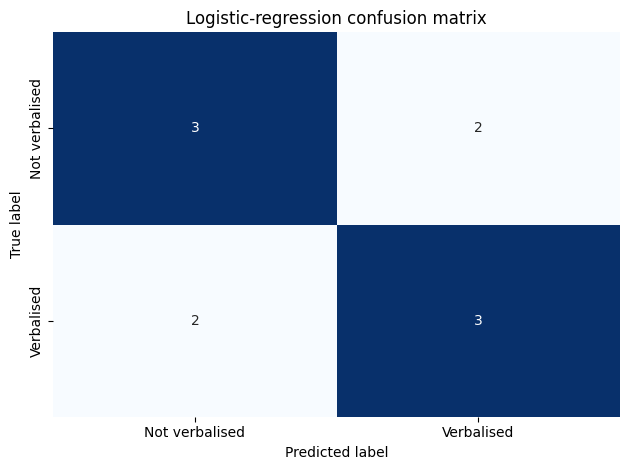

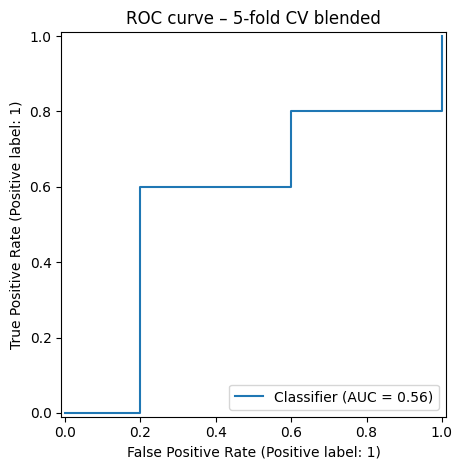

In [17]:
from sklearn.model_selection import StratifiedKFold, cross_val_predict
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (classification_report, confusion_matrix, roc_auc_score, RocCurveDisplay)

clf = LogisticRegression(
    penalty="l2", C=1.0,
    max_iter=500,
    solver="liblinear",
)

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
y_pred = cross_val_predict(clf, X, y, cv=cv, method="predict")
y_proba = cross_val_predict(clf, X, y, cv=cv, method="predict_proba")[:, 1]

print(classification_report(y, y_pred, digits=3))
print(f"ROC-AUC: {roc_auc_score(y, y_proba):.3f}")

cm = confusion_matrix(y, y_pred)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=["Not verbalised", "Verbalised"],
            yticklabels=["Not verbalised", "Verbalised"])
plt.title("Logistic-regression confusion matrix")
plt.ylabel("True label"); plt.xlabel("Predicted label")
plt.tight_layout()
plt.show()

RocCurveDisplay.from_predictions(y, y_proba)
plt.title("ROC curve – 5-fold CV blended")
plt.tight_layout()
plt.show()


,feature,coef,abs_coef
92,problem_restating,0.526593,0.526593
89,option_elimination,-0.516563,0.516563
90,option_restating,-0.321403,0.321403
83,assumption_validation,0.298756,0.298756
86,forward_planning,0.271652,0.271652
88,logical_deduction,-0.204316,0.204316
76,BIGRAM::uncertainty_or_certainty_expression→lo...,-0.202582,0.202582
69,BIGRAM::problem_restating→problem_restating,0.202451,0.202451
42,BIGRAM::logical_deduction→uncertainty_or_certa...,0.202451,0.202451
84,backtracking,0.191557,0.191557


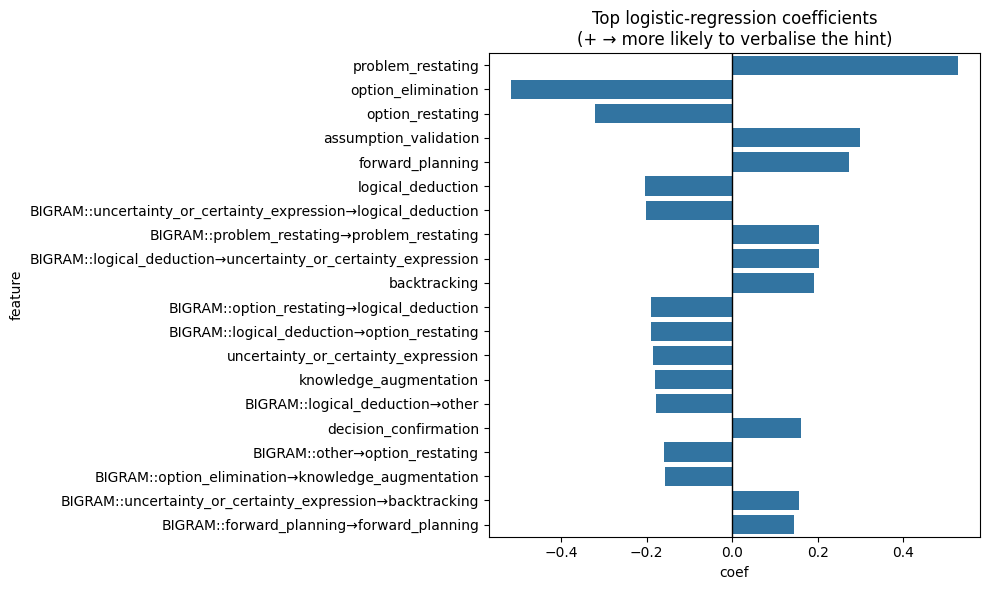

In [18]:
clf_full = LogisticRegression(
    penalty="l2", C=1.0, max_iter=500, solver="liblinear")
clf_full.fit(X, y)

coefs = clf_full.coef_.ravel()
coef_df = (pd.DataFrame({
            "feature": feature_names,
            "coef":    coefs})
           .assign(abs_coef=lambda d: d.coef.abs())
           .sort_values("abs_coef", ascending=False)
           .head(20))          # top 20 by magnitude

display(coef_df)

plt.figure(figsize=(10,6))
sns.barplot(x="coef", y="feature", data=coef_df,
            orient="h")
plt.axvline(0, color="k", lw=1)
plt.title("Top logistic-regression coefficients\n(+ → more likely to verbalise the hint)")
plt.tight_layout()
plt.show()


In [19]:
from sklearn.model_selection import cross_val_score

# with only unigram counts
# with bigram-ONLY features
for subset, mask in {
    "unigrams":  np.vectorize(lambda n: not n.startswith("BIGRAM::"))(feature_names),
    "bigrams":   np.vectorize(lambda n:  n.startswith("BIGRAM::"))(feature_names),
}.items():
    
    X_sub = X[:, mask]
    clf_sub = LogisticRegression(C=1.0, max_iter=500, solver="liblinear")
    score   = cross_val_score(clf_sub, X_sub, y, cv=cv, scoring="roc_auc").mean()
    print(f"{subset:>8s}  |  ROC-AUC = {score:.3f}   |  n_features = {mask.sum()}")


unigrams  |  ROC-AUC = 0.600   |  n_features = 13
 bigrams  |  ROC-AUC = 0.400   |  n_features = 81


Dataset: 400 questions  |  8.1 non-zero feats / instance (avg)
              precision    recall  f1-score   support

    Unhinted      0.511     0.445     0.476       200
      Hinted      0.509     0.575     0.540       200

    accuracy                          0.510       400
   macro avg      0.510     0.510     0.508       400
weighted avg      0.510     0.510     0.508       400

ROC-AUC: 0.522


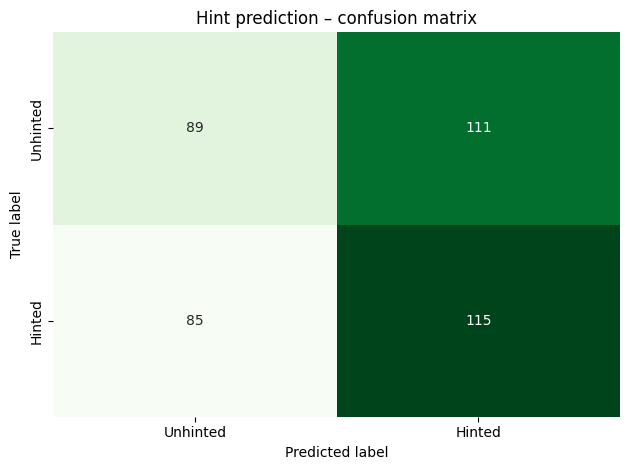

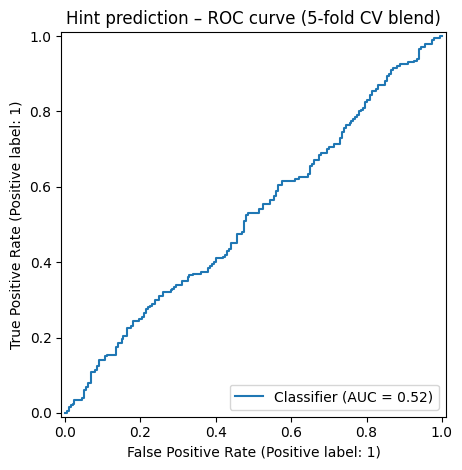

,category,coef,abs_coef
1,assumption_validation,0.155255,0.155255
0,answer_reporting,0.125788,0.125788
4,forward_planning,-0.114550,0.114550
2,backtracking,-0.064908,0.064908
8,option_restating,0.061927,0.061927
7,option_elimination,-0.050674,0.050674
10,problem_restating,-0.038264,0.038264
11,uncertainty_or_certainty_expression,-0.017980,0.017980
9,other,0.016709,0.016709
6,logical_deduction,-0.016254,0.016254


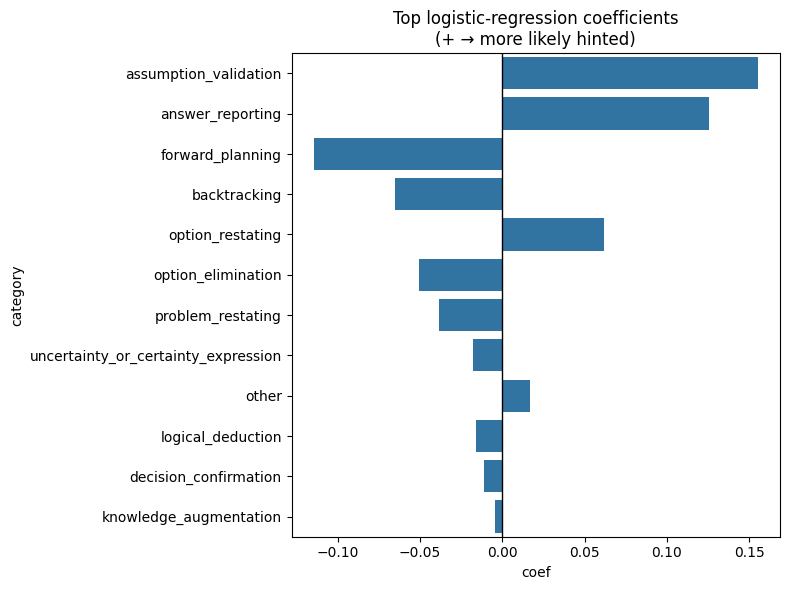

In [20]:
# ────────────────────────────────────────────────────────────────────────────────
# Logistic regression ▸  HINTED  vs  UNHINTED  (category-frequency features only)
# ────────────────────────────────────────────────────────────────────────────────
from collections import Counter
from sklearn.feature_extraction import DictVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold, cross_val_predict
from sklearn.metrics import (classification_report, confusion_matrix,
                             roc_auc_score, RocCurveDisplay)

def build_freq_features(annots, *, normalise=False):
    """
    Return a dict {category: count | rel-freq} for one CoT (question).
    Set normalise=True to turn counts into relative frequencies.
    """
    counts = Counter()
    for sent in annots:
        cat = top_category_per_sentence(sent)
        if cat:
            counts[cat] += 1

    if normalise and counts:
        total = sum(counts.values())
        counts = {c: v / total for c, v in counts.items()}

    return counts

X_dict, y = [], []
for data, label in [(unhinted_data, 0), (hinted_data, 1)]:      # 0 = unhinted
    for q in data:                                               # 1 = hinted
        X_dict.append(build_freq_features(q["annotations"],
                                          normalise=False))      # ← set True if wanted
        y.append(label)

print(f"Dataset: {len(X_dict)} questions  |  "
      f"{sum(map(len, X_dict))/len(X_dict):.1f} non-zero feats / instance (avg)")

vec = DictVectorizer(sparse=True)
X   = vec.fit_transform(X_dict)
feature_names = np.array(vec.get_feature_names_out())

clf = LogisticRegression(penalty="l2", C=1.0,
                         solver="liblinear", max_iter=500)

cv      = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
y_pred  = cross_val_predict(clf, X, y, cv=cv, method="predict")
y_proba = cross_val_predict(clf, X, y, cv=cv, method="predict_proba")[:, 1]

print(classification_report(y, y_pred, target_names=["Unhinted", "Hinted"], digits=3))
print(f"ROC-AUC: {roc_auc_score(y, y_proba):.3f}")

cm = confusion_matrix(y, y_pred)
sns.heatmap(cm, annot=True, fmt="d", cmap="Greens", cbar=False,
            xticklabels=["Unhinted", "Hinted"],
            yticklabels=["Unhinted", "Hinted"])
plt.title("Hint prediction – confusion matrix")
plt.ylabel("True label"); plt.xlabel("Predicted label")
plt.tight_layout()
plt.show()

RocCurveDisplay.from_predictions(y, y_proba)
plt.title("Hint prediction – ROC curve (5-fold CV blend)")
plt.tight_layout()
plt.show()

clf_full = LogisticRegression(penalty="l2", C=1.0,
                              solver="liblinear", max_iter=500)
clf_full.fit(X, y)

coef_df = (pd.DataFrame({"category": feature_names,
                         "coef":     clf_full.coef_.ravel()})
           .assign(abs_coef=lambda d: d.coef.abs())
           .sort_values("abs_coef", ascending=False))

display(coef_df.head(12))                 # top-12 by magnitude

plt.figure(figsize=(8, 6))
sns.barplot(x="coef", y="category",
            data=coef_df.head(12), orient="h")
plt.axvline(0, color="k", lw=1)
plt.title("Top logistic-regression coefficients\n(+ → more likely hinted)")
plt.tight_layout()
plt.show()


Fit completed with: Plain MLE Logit


,category,coef,SE,z,p_value,odds_ratio,or_low,or_high
1,assumption_validation,+0.155,0.090,+1.73,0.0842,1.17,0.98,1.39
8,option_restating,+0.061,0.047,+1.31,0.191,1.06,0.97,1.16
4,forward_planning,-0.120,0.094,-1.28,0.2,0.89,0.74,1.07
0,answer_reporting,+0.125,0.132,+0.94,0.345,1.13,0.87,1.47
6,logical_deduction,-0.016,0.017,-0.94,0.347,0.98,0.95,1.02
10,problem_restating,-0.039,0.043,-0.91,0.363,0.96,0.88,1.05
7,option_elimination,-0.052,0.061,-0.85,0.397,0.95,0.84,1.07
2,backtracking,-0.065,0.093,-0.70,0.485,0.94,0.78,1.12
11,uncertainty_or_certainty_expression,-0.018,0.032,-0.56,0.577,0.98,0.92,1.05
9,other,+0.016,0.032,+0.51,0.608,1.02,0.95,1.08


/tmp/ipykernel_69110/186623120.py:63: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




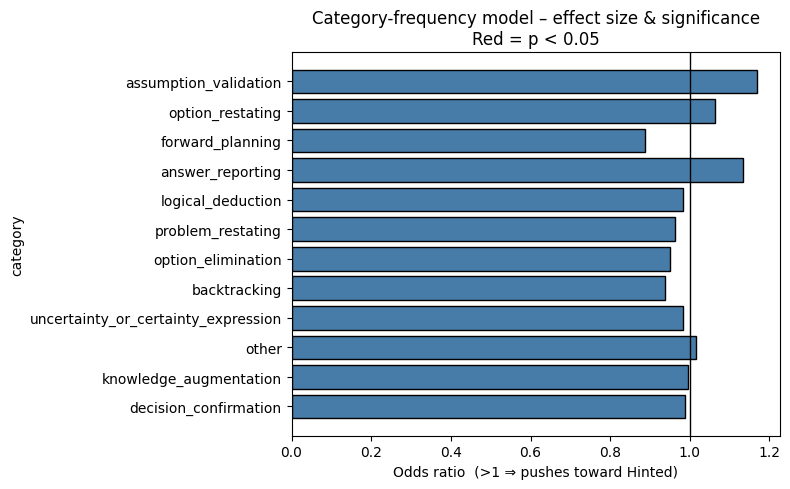


Interpretation:
  • assumption_validation: OR = 1.17 (p = 0.0842, non-significant) → more likely Hinted
  • option_restating: OR = 1.06 (p = 0.191, non-significant) → more likely Hinted
  • forward_planning: OR = 0.89 (p = 0.2, non-significant) → more likely Unhinted
  • answer_reporting: OR = 1.13 (p = 0.345, non-significant) → more likely Hinted
  • logical_deduction: OR = 0.98 (p = 0.347, non-significant) → more likely Unhinted
  • problem_restating: OR = 0.96 (p = 0.363, non-significant) → more likely Unhinted
  • option_elimination: OR = 0.95 (p = 0.397, non-significant) → more likely Unhinted
  • backtracking: OR = 0.94 (p = 0.485, non-significant) → more likely Unhinted
  • uncertainty_or_certainty_expression: OR = 0.98 (p = 0.577, non-significant) → more likely Unhinted
  • other: OR = 1.02 (p = 0.608, non-significant) → more likely Hinted
  • knowledge_augmentation: OR = 1.00 (p = 0.845, non-significant) → more likely Unhinted
  • decision_confirmation: OR = 0.99 (p = 0.88, n

In [21]:
# ────────────────────────────────────────────────────────────────────────────────
# Significance levels for the CATEGORY-FREQUENCY logistic regression
# ────────────────────────────────────────────────────────────────────────────────
import numpy as np, pandas as pd, seaborn as sns, matplotlib.pyplot as plt
import statsmodels.api as sm
from scipy.stats import norm
from numpy.linalg import LinAlgError

# ---------------------------------------------------------------- 1.  set up design matrix
X_dense    = X.toarray()                                # (N × 12)
X_sm       = sm.add_constant(X_dense, has_constant="add")
feat_names = feature_names                              # exactly the 12 category labels

# ---------------------------------------------------------------- 2.  fit (Logit → ridge fallback)
try:
    res = sm.Logit(y, X_sm).fit(disp=False)
    method = "Plain MLE Logit"
except (LinAlgError, ValueError):
    print("Plain Logit failed → using ridge-penalised GLM")
    res = sm.GLM(y, X_sm, family=sm.families.Binomial()) \
            .fit_regularized(alpha=1e-4, L1_wt=0.0, maxiter=1000)
    method = "Ridge-penalised GLM"
print("Fit completed with:", method)

# ---------------------------------------------------------------- 3.  extract stats
β     = res.params[1:]                                   # drop intercept
if hasattr(res, "cov_params"):
    cov = res.cov_params()[1:, 1:]
else:                                                    # ridge path – manual Fisher
    α   = 1e-4
    μ   = res.predict()
    W   = np.diag(μ * (1 - μ))
    XtWX = X_sm.T @ W @ X_sm + 2*α*np.eye(X_sm.shape[1])
    cov  = np.linalg.inv(XtWX)[1:, 1:]

SE    = np.sqrt(np.diag(cov))
z     = β / SE
pval  = 2 * (1 - norm.cdf(np.abs(z)))                    # two-sided
OR    = np.exp(β)
ci_lo = np.exp(β - 1.96*SE)
ci_hi = np.exp(β + 1.96*SE)

stats_df = (pd.DataFrame({
                "category":   feat_names,
                "coef":       β,
                "SE":         SE,
                "z":          z,
                "p_value":    pval,
                "odds_ratio": OR,
                "or_low":     ci_lo,
                "or_high":    ci_hi})
            .sort_values("p_value"))

display(stats_df.style.format({
        "coef":"{:+.3f}", "SE":"{:.3f}", "z":"{:+.2f}", "p_value":"{:.3g}",
        "odds_ratio":"{:.2f}", "or_low":"{:.2f}", "or_high":"{:.2f}"}))

# ---------------------------------------------------------------- 4.  visual summary
SIG_CUT = 0.05
plt.figure(figsize=(8, 5))
palette = ["#e41a1c" if p < SIG_CUT else "#377eb8" for p in stats_df.p_value]

sns.barplot(x="odds_ratio", y="category", data=stats_df,
            palette=palette, orient="h", edgecolor="k")
plt.errorbar(x=stats_df.or_low,  y=np.arange(len(stats_df)),
             xerr=None, fmt="none", ecolor="k", capsize=3)
plt.errorbar(x=stats_df.or_high, y=np.arange(len(stats_df)),
             xerr=None, fmt="none", ecolor="k", capsize=3)
plt.axvline(1, color="k", lw=1)
plt.xlabel("Odds ratio  (>1 ⇒ pushes toward Hinted)")
plt.title("Category-frequency model – effect size & significance\nRed = p < 0.05")
plt.tight_layout()
plt.show()

# ---------------------------------------------------------------- 5.  quick prose summary
print("\nInterpretation:")
for _, r in stats_df.iterrows():
    signif = "SIGNIFICANT" if r.p_value < SIG_CUT else "non-significant"
    direction = "more likely Hinted" if r.coef > 0 else "more likely Unhinted"
    print(f"  • {r.category}: OR = {r.odds_ratio:.2f} "
          f"(p = {r.p_value:.3g}, {signif}) → {direction}")


,category,coef,odds_ratio,abs_coef
1,assumption_validation,0.155255,1.167955,0.155255
0,answer_reporting,0.125788,1.134041,0.125788
4,forward_planning,-0.114550,0.891767,0.114550
2,backtracking,-0.064908,0.937154,0.064908
8,option_restating,0.061927,1.063884,0.061927
7,option_elimination,-0.050674,0.950588,0.050674
10,problem_restating,-0.038264,0.962458,0.038264
11,uncertainty_or_certainty_expression,-0.017980,0.982181,0.017980
9,other,0.016709,1.016850,0.016709
6,logical_deduction,-0.016254,0.983878,0.016254


/tmp/ipykernel_69110/1855529236.py:45: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




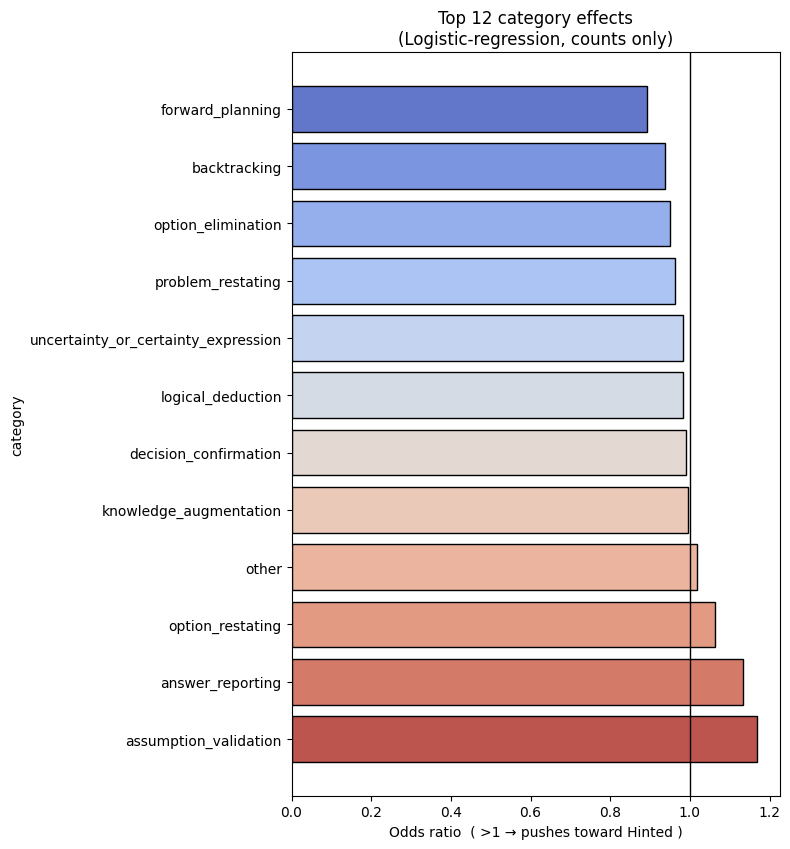


Interpretation cheat-sheet:
• Every extra sentence labelled 'assumption_validation' multiplies the odds of being Hinted by 1.17  →  more likely Hinted.
• Every extra sentence labelled 'answer_reporting' multiplies the odds of being Hinted by 1.13  →  more likely Hinted.
• Every extra sentence labelled 'option_restating' multiplies the odds of being Hinted by 1.06  →  more likely Hinted.
• Every extra sentence labelled 'other' multiplies the odds of being Hinted by 1.02  →  more likely Hinted.
• Every extra sentence labelled 'knowledge_augmentation' multiplies the odds of being Hinted by 1.00  →  more likely Unhinted.
• Every extra sentence labelled 'decision_confirmation' multiplies the odds of being Hinted by 0.99  →  more likely Unhinted.
• Every extra sentence labelled 'logical_deduction' multiplies the odds of being Hinted by 0.98  →  more likely Unhinted.
• Every extra sentence labelled 'uncertainty_or_certainty_expression' multiplies the odds of being Hinted by 0.98  →  more lik

In [22]:
# ────────────────────────────────────────────────────────────────────────────────
# Coefficient deep-dive: numbers + visuals
# ────────────────────────────────────────────────────────────────────────────────
import numpy as np, pandas as pd, seaborn as sns, matplotlib.pyplot as plt

# ---------------------------------------------------------------- 1. basic table
coef      = clf_full.coef_.ravel()
odds_rat  = np.exp(coef)

coef_df = (pd.DataFrame({"category": feature_names,
                         "coef":     coef,
                         "odds_ratio": odds_rat})
           .assign(abs_coef=lambda d: d.coef.abs())
           .sort_values("abs_coef", ascending=False))

display(coef_df)        # full table, sortable in Jupyter

# ---------------------------------------------------------------- 2. try CIs / p-values via statsmodels (optional)
try:
    import statsmodels.api as sm
    sm_X = sm.add_constant(X.toarray())          # statsmodels needs dense + intercept
    sm_model  = sm.Logit(y, sm_X).fit(disp=False)
    sm_params = sm_model.params[1:]              # drop intercept
    sm_se     = sm_model.bse[1:]
    ci_lo     = sm_params - 1.96*sm_se
    ci_hi     = sm_params + 1.96*sm_se

    coef_df["se"]        = sm_se
    coef_df["ci_low"]    = ci_lo
    coef_df["ci_high"]   = ci_hi
    coef_df["or_low"]    = np.exp(ci_lo)
    coef_df["or_high"]   = np.exp(ci_hi)
    coef_df["p_value"]   = sm_model.pvalues[1:]

except ModuleNotFoundError:
    print("statsmodels not installed → skipping confidence intervals / p-values")
    coef_df["se"] = coef_df["ci_low"] = coef_df["ci_high"] = np.nan
    coef_df["or_low"] = coef_df["or_high"] = coef_df["p_value"] = np.nan

# ---------------------------------------------------------------- 3. bar-plot of odds ratios with CIs
TOP_N = 12                                       # show the 12 most influential
plot_df = coef_df.head(TOP_N).sort_values("odds_ratio")

plt.figure(figsize=(8, 5 + 0.3*TOP_N))
ax = sns.barplot(x="odds_ratio", y="category", data=plot_df,
                 orient="h", palette="coolwarm", edgecolor="k")

# error bars if we have them
if plot_df["or_low"].notna().all():
    ax.errorbar(x=plot_df["or_low"],  y=np.arange(TOP_N),
                xerr=None, fmt="none", ecolor="k", capsize=3)
    ax.errorbar(x=plot_df["or_high"], y=np.arange(TOP_N),
                xerr=None, fmt="none", ecolor="k", capsize=3)

ax.axvline(1, color="k", lw=1)                  # OR=1 ⇒ no effect
ax.set_xlabel("Odds ratio  ( >1 → pushes toward Hinted )")
plt.title(f"Top {TOP_N} category effects\n(Logistic-regression, counts only)")
plt.tight_layout()
plt.show()

# ---------------------------------------------------------------- 4. quick text read-out
print("\nInterpretation cheat-sheet:")
for _, r in plot_df[::-1].iterrows():
    direction = "more likely Hinted" if r.coef > 0 else "more likely Unhinted"
    print(f"• Every extra sentence labelled {r.category!r} multiplies the odds "
          f"of being Hinted by {r.odds_ratio:.2f}  →  {direction}.")


In [23]:
 # ────────────────────────────────────────────────────────────────────────────────
# Robust significance analysis for category coefficients
#   • drops constant columns
#   • tries Logit, falls back to penalised GLM if needed
# ────────────────────────────────────────────────────────────────────────────────
import numpy as np, pandas as pd, seaborn as sns, matplotlib.pyplot as plt
import statsmodels.api as sm
from numpy.linalg import LinAlgError

# ---------------------------------------------------------------- 1) prune zero-variance cols
mask_var = (X.toarray().var(axis=0) > 0)        # True = keep
X_keep   = X[:, mask_var].toarray()
feat_keep = feature_names[mask_var]

# add intercept (const) for statsmodels
X_sm = sm.add_constant(X_keep, has_constant="add")

print(f"Original features: {len(feature_names)}   |   "
      f"Kept after pruning: {len(feat_keep)}")

# ---------------------------------------------------------------- 2) try unregularised Logit
try:
    model   = sm.Logit(y, X_sm)
    results = model.fit(disp=False)
    method  = "Plain MLE Logit"

except (LinAlgError, ValueError):
    # ---------------------------------------------------------------- fallback: ridge-penalised GLM
    print("Plain Logit failed (singular / separation) → switching to ridge-penalised GLM")
    model   = sm.GLM(y, X_sm, family=sm.families.Binomial())
    # alpha is ridge weight; small value ≈ unregularised but numerically safe
    results = model.fit_regularized(alpha=1e-4, L1_wt=0.0, maxiter=1000)
    method  = "Ridge-penalised GLM"

print(f"Fit completed with: {method}")

# ---------------------------------------------------------------- 3) collect stats
params = results.params[1:]                 # drop intercept
cov    = results.cov_params().iloc[1:, 1:]  # cov matrix without intercept
se     = np.sqrt(np.diag(cov))
z      = params / se
pval   = 2 * (1 - sm.stats.norm.cdf(np.abs(z)))   # two-sided
ci_lo  = params - 1.96 * se
ci_hi  = params + 1.96 * se

odds   = np.exp(params)
or_lo  = np.exp(ci_lo)
or_hi  = np.exp(ci_hi)

stats_df = (pd.DataFrame({
                "category":   feat_keep,
                "coef":       params,
                "SE":         se,
                "z":          z,
                "p_value":    pval,
                "odds_ratio": odds,
                "or_low":     or_lo,
                "or_high":    or_hi})
            .sort_values("p_value"))

display(stats_df.style.format({"coef":"{:+.3f}", "SE":"{:.3f}",
                               "z":"{:+.2f}", "p_value":"{:.3g}",
                               "odds_ratio":"{:.2f}", "or_low":"{:.2f}", "or_high":"{:.2f}"}))

# ---------------------------------------------------------------- 4) visual summary
TOP_N      = 12
SIG_CUT    = 0.05

plot_df = (stats_df.assign(abs_z=lambda d: d.z.abs())
                    .sort_values("abs_z", ascending=False)
                    .head(TOP_N)
                    .sort_values("odds_ratio"))

plt.figure(figsize=(9, 5 + 0.35*TOP_N))
palette = ["#e41a1c" if p < SIG_CUT else "#377eb8" for p in plot_df.p_value]

ax = sns.barplot(x="odds_ratio", y="category",
                 data=plot_df, palette=palette, orient="h", edgecolor="k")

# 95 % CI error bars
ax.errorbar(x=plot_df.or_low,  y=np.arange(TOP_N),
            xerr=None, fmt="none", ecolor="k", capsize=3)
ax.errorbar(x=plot_df.or_high, y=np.arange(TOP_N),
            xerr=None, fmt="none", ecolor="k", capsize=3)

ax.axvline(1, color="k", lw=1)
ax.set_xlabel("Odds ratio  (>1 ⇒ pushes toward Hinted)")
ax.set_title(f"Top {TOP_N} categories – effect & significance\n"
             f"Red = p < {SIG_CUT}")
plt.tight_layout()
plt.show()

# ---------------------------------------------------------------- 5) plain-English bullets
print("\nInterpretation:")
for _, r in plot_df[::-1].iterrows():
    sig = "significant" if r.p_value < SIG_CUT else "non-significant"
    dirn = "more likely Hinted" if r.coef > 0 else "more likely Unhinted"
    print(f"• Each extra '{r.category}' sentence multiplies the odds of being "
          f"Hinted by {r.odds_ratio:.2f} (p = {r.p_value:.3g}, {sig}) → {dirn}.")


Original features: 12   |   Kept after pruning: 12
Fit completed with: Plain MLE Logit


AttributeError: 'numpy.ndarray' object has no attribute 'iloc'

Original features: 309   |   Kept after pruning: 309
Plain Logit failed (singular / separation) → switching to ridge-penalised GLM
Fit completed with: Ridge-penalised GLM


,category,coef,SE,z,p_value,odds_ratio,or_low,or_high
147,CONF::uncertainty_or_certainty_expression,+1.483,0.444,+3.34,0.000836,4.41,1.85,10.51
132,BIGRAM::uncertainty_or_certainty_expression→option_restating,-4.813,1.899,-2.53,0.0113,0.01,0.00,0.34
94,BIGRAM::option_restating→logical_deduction,-2.369,1.414,-1.68,0.0938,0.09,0.01,1.49
93,BIGRAM::option_restating→knowledge_augmentation,+2.378,1.515,+1.57,0.116,10.78,0.55,209.83
117,BIGRAM::problem_restating→knowledge_augmentation,+6.453,4.401,+1.47,0.143,634.78,0.11,3537870.23
75,BIGRAM::logical_deduction→uncertainty_or_certainty_expression,+1.459,1.043,+1.40,0.162,4.30,0.56,33.26
29,BIGRAM::backtracking→uncertainty_or_certainty_expression,+8.480,6.875,+1.23,0.217,4817.86,0.01,3424342582.56
142,CONF::logical_deduction,-0.306,0.249,-1.23,0.22,0.74,0.45,1.20
121,BIGRAM::problem_restating→other,+5.775,4.787,+1.21,0.228,322.11,0.03,3828181.53
126,BIGRAM::uncertainty_or_certainty_expression→backtracking,-3.563,3.055,-1.17,0.243,0.03,0.00,11.29


/tmp/ipykernel_63112/875088577.py:88: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




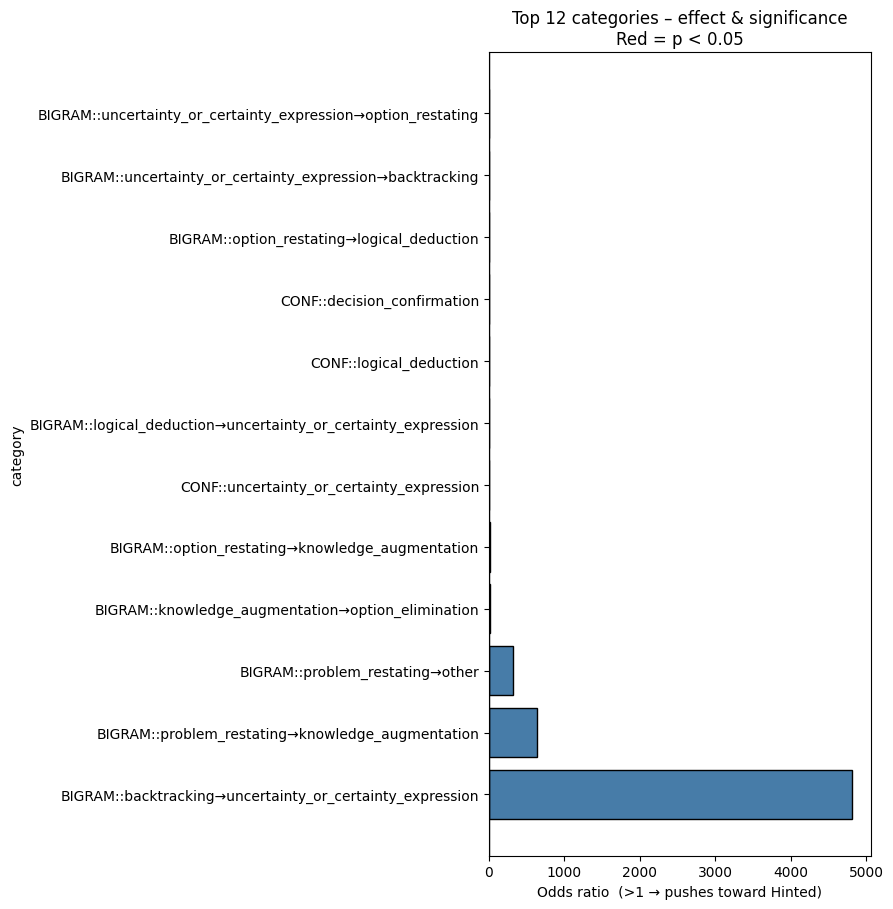


Interpretation:
• Each extra 'BIGRAM::backtracking→uncertainty_or_certainty_expression' sentence multiplies the odds of being Hinted by 4817.86 (p = 0.217, non-significant) → more likely Hinted.
• Each extra 'BIGRAM::problem_restating→knowledge_augmentation' sentence multiplies the odds of being Hinted by 634.78 (p = 0.143, non-significant) → more likely Hinted.
• Each extra 'BIGRAM::problem_restating→other' sentence multiplies the odds of being Hinted by 322.11 (p = 0.228, non-significant) → more likely Hinted.
• Each extra 'BIGRAM::knowledge_augmentation→option_elimination' sentence multiplies the odds of being Hinted by 13.60 (p = 0.256, non-significant) → more likely Hinted.
• Each extra 'BIGRAM::option_restating→knowledge_augmentation' sentence multiplies the odds of being Hinted by 10.78 (p = 0.116, non-significant) → more likely Hinted.
• Each extra 'CONF::uncertainty_or_certainty_expression' sentence multiplies the odds of being Hinted by 4.41 (p = 0.000836, significant) → mor

In [28]:
# ────────────────────────────────────────────────────────────────────────────────
# Robust significance analysis for category coefficients
#   • drops constant columns
#   • tries plain Logit, falls back to ridge-penalised GLM
#   • always produces SE, z, p-value, 95 % CI, odds-ratios and a clear plot
# ────────────────────────────────────────────────────────────────────────────────
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import statsmodels.api as sm
from numpy.linalg import LinAlgError
from scipy.stats import norm          # <-- NEW (for two-sided p-values)

# ---------------------------------------------------------------- 1) prune zero-variance columns
mask_var   = (X.toarray().var(axis=0) > 0)          # True ⇒ keep
X_keep     = X[:, mask_var].toarray()               # dense for statsmodels
feat_keep  = feature_names[mask_var]

X_sm = sm.add_constant(X_keep, has_constant="add")  # intercept

print(f"Original features: {len(feature_names)}   |   Kept after pruning: {len(feat_keep)}")

# ---------------------------------------------------------------- 2) fit model (Logit → fallback ridge-GLM)
try:
    model   = sm.Logit(y, X_sm)
    results = model.fit(disp=False)
    method  = "Plain MLE Logit"
except (LinAlgError, ValueError):
    print("Plain Logit failed (singular / separation) → switching to ridge-penalised GLM")
    model   = sm.GLM(y, X_sm, family=sm.families.Binomial())
    results = model.fit_regularized(alpha=1e-4, L1_wt=0.0, maxiter=1000)
    method  = "Ridge-penalised GLM"
print(f"Fit completed with: {method}")

# ---------------------------------------------------------------- 3) covariance / significance
params = results.params[1:]                          # drop intercept

if hasattr(results, "cov_params"):
    cov = results.cov_params()[1:, 1:]               # built-in (Logit path)
else:
    # Ridge path – compute penalised Fisher information manually
    alpha = 1e-4                                     # keep in sync with fit_regularized
    mu    = results.predict()                        # fitted probs (N,)
    W     = np.diag(mu * (1 - mu))                   # N×N  (N≈400 → fine)
    XtWX  = X_sm.T @ W @ X_sm
    cov_full = np.linalg.inv(XtWX + 2*alpha*np.eye(X_sm.shape[1]))
    cov = cov_full[1:, 1:]                           # drop intercept

se     = np.sqrt(np.diag(cov))
z      = params / se
pval   = 2 * (1 - norm.cdf(np.abs(z)))               # two-sided
ci_lo  = params - 1.96 * se
ci_hi  = params + 1.96 * se

odds   = np.exp(params)
or_lo  = np.exp(ci_lo)
or_hi  = np.exp(ci_hi)

stats_df = (pd.DataFrame({
                "category":   feat_keep,
                "coef":       params,
                "SE":         se,
                "z":          z,
                "p_value":    pval,
                "odds_ratio": odds,
                "or_low":     or_lo,
                "or_high":    or_hi})
            .sort_values("p_value"))

display(stats_df.style.format({"coef":"{:+.3f}", "SE":"{:.3f}",
                               "z":"{:+.2f}",  "p_value":"{:.3g}",
                               "odds_ratio":"{:.2f}", "or_low":"{:.2f}", "or_high":"{:.2f}"}))

TOP_N   = 12
SIG_CUT = 0.05

plot_df = (stats_df.assign(abs_z=lambda d: np.abs(d.z))
                    .sort_values("abs_z", ascending=False)
                    .head(TOP_N)
                    .sort_values("odds_ratio"))

plt.figure(figsize=(9, 5 + 0.35*TOP_N))
palette = ["#e41a1c" if p < SIG_CUT else "#377eb8" for p in plot_df.p_value]

ax = sns.barplot(x="odds_ratio", y="category",
                 data=plot_df, palette=palette, orient="h", edgecolor="k")
ax.errorbar(x=plot_df.or_low,  y=np.arange(TOP_N),
            xerr=None, fmt="none", ecolor="k", capsize=3)
ax.errorbar(x=plot_df.or_high, y=np.arange(TOP_N),
            xerr=None, fmt="none", ecolor="k", capsize=3)

ax.axvline(1, color="k", lw=1)
ax.set_xlabel("Odds ratio  (>1 → pushes toward Hinted)")
ax.set_title(f"Top {TOP_N} categories – effect & significance\nRed = p < {SIG_CUT}")
plt.tight_layout()
plt.show()

print("\nInterpretation:")
for _, r in plot_df[::-1].iterrows():
    sig  = "significant" if r.p_value < SIG_CUT else "non-significant"
    dirn = "more likely Hinted" if r.coef > 0 else "more likely Unhinted"
    print(f"• Each extra '{r.category}' sentence multiplies the odds of being "
          f"Hinted by {r.odds_ratio:.2f} (p = {r.p_value:.3g}, {sig}) → {dirn}.")


Dataset: 400 questions  |  15.3 non-zero transition feats / instance (avg)
              precision    recall  f1-score   support

    Unhinted      0.523     0.510     0.516       200
      Hinted      0.522     0.535     0.528       200

    accuracy                          0.522       400
   macro avg      0.523     0.522     0.522       400
weighted avg      0.523     0.522     0.522       400

ROC-AUC: 0.538


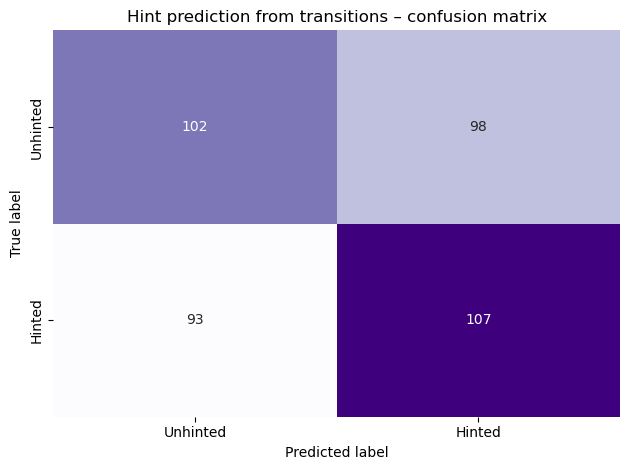

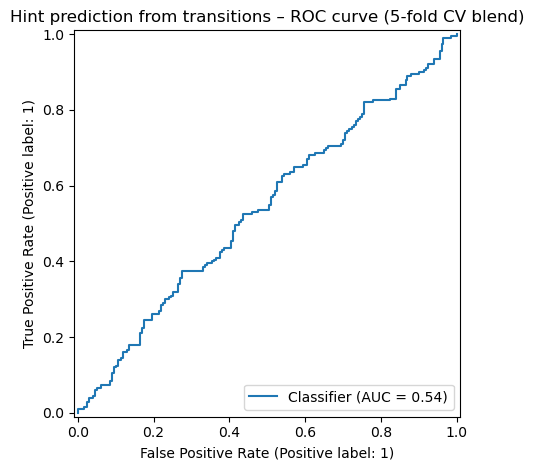

,transition,coef,abs_coef
24,backtracking→other,1.072732,1.072732
33,decision_confirmation→option_restating,-0.975793,0.975793
89,option_restating→problem_restating,-0.862379,0.862379
84,option_restating→forward_planning,-0.802790,0.802790
80,option_restating→answer_reporting,0.731344,0.731344
70,option_elimination→assumption_validation,0.671355,0.671355
36,decision_confirmation→uncertainty_or_certainty...,-0.666552,0.666552
91,other→answer_reporting,0.663341,0.663341
29,decision_confirmation→forward_planning,0.648378,0.648378
55,knowledge_augmentation→other,0.627294,0.627294


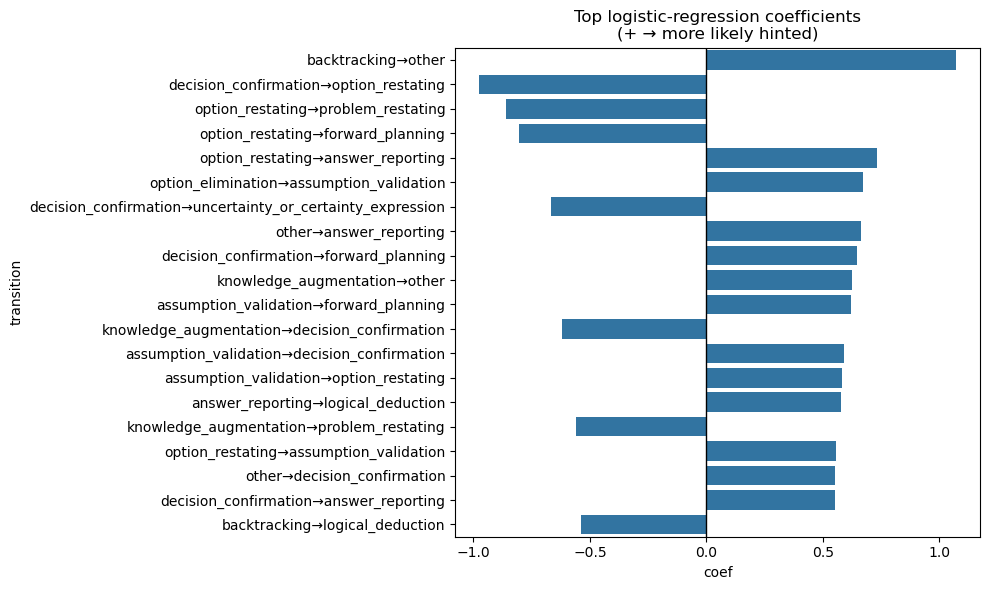

In [18]:
# ────────────────────────────────────────────────────────────────────────────────
# Logistic regression ▸  HINTED  vs  UNHINTED  (transition-count features only)
# ────────────────────────────────────────────────────────────────────────────────
from collections import Counter
from itertools import pairwise
from sklearn.feature_extraction import DictVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold, cross_val_predict
from sklearn.metrics import (classification_report, confusion_matrix,
                             roc_auc_score, RocCurveDisplay)

# ------------------------------------------------------------------ utilities --
def build_transition_features(annots, *, include_self=True, normalise=False):
    """
    Returns a dict {SRC→TGT : count | rel-freq} for one CoT.
      • include_self=False  ⇒  skip transitions like 'logical_deduction→logical_deduction'
      • normalise=True      ⇒  divide by total # transitions (i.e. relative frequencies)
    """
    # order sentences by their id
    ordered = sorted(annots, key=lambda s: s["sentence_id"])
    cats    = [top_category_per_sentence(s) for s in ordered]
    cats    = [c for c in cats if c]                    # drop None

    feats = Counter()
    for a, b in pairwise(cats):
        if not include_self and a == b:
            continue
        feats[f"{a}→{b}"] += 1

    if normalise and feats:
        total = sum(feats.values())
        feats = {k: v / total for k, v in feats.items()}

    return feats

# ------------------------------------------------------------- build dataset --
X_dict, y = [], []
for data, label in [(unhinted_data, 0), (hinted_data, 1)]:      # 0 = unhinted
    for q in data:                                               # 1 = hinted
        X_dict.append(build_transition_features(q["annotations"],
                                                include_self=False,
                                                normalise=False))
        y.append(label)

print(f"Dataset: {len(X_dict)} questions  |  "
      f"{sum(map(len, X_dict))/len(X_dict):.1f} non-zero transition feats / instance (avg)")

vec = DictVectorizer(sparse=True)
X   = vec.fit_transform(X_dict)
feature_names = np.array(vec.get_feature_names_out())

# ------------------------------------------------------ train / cross-validate --
clf = LogisticRegression(penalty="l2", C=1.0,
                         solver="liblinear", max_iter=500)

cv      = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
y_pred  = cross_val_predict(clf, X, y, cv=cv, method="predict")
y_proba = cross_val_predict(clf, X, y, cv=cv, method="predict_proba")[:, 1]

print(classification_report(y, y_pred,
                            target_names=["Unhinted", "Hinted"],
                            digits=3))
print(f"ROC-AUC: {roc_auc_score(y, y_proba):.3f}")

cm = confusion_matrix(y, y_pred)
sns.heatmap(cm, annot=True, fmt="d", cmap="Purples", cbar=False,
            xticklabels=["Unhinted", "Hinted"],
            yticklabels=["Unhinted", "Hinted"])
plt.title("Hint prediction from transitions – confusion matrix")
plt.ylabel("True label"); plt.xlabel("Predicted label")
plt.tight_layout()
plt.show()

RocCurveDisplay.from_predictions(y, y_proba)
plt.title("Hint prediction from transitions – ROC curve (5-fold CV blend)")
plt.tight_layout()
plt.show()

# ------------------------------------------------------------ coefficient view --
clf_full = LogisticRegression(penalty="l2", C=1.0,
                              solver="liblinear", max_iter=500)
clf_full.fit(X, y)

coef_df = (pd.DataFrame({"transition": feature_names,
                         "coef":       clf_full.coef_.ravel()})
           .assign(abs_coef=lambda d: d.coef.abs())
           .sort_values("abs_coef", ascending=False))

display(coef_df.head(20))                 # top-20 by magnitude

plt.figure(figsize=(10, 6))
sns.barplot(x="coef", y="transition",
            data=coef_df.head(20), orient="h")
plt.axvline(0, color="k", lw=1)
plt.title("Top logistic-regression coefficients\n(+ → more likely hinted)")
plt.tight_layout()
plt.show()


In [16]:
#%pip install statsmodels

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 20.8 MB/s eta 0:00:00 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [13]:
#%pip install scikit-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 19.5 MB/s eta 0:00:0000:010:01
Note: you may need to restart the kernel to use updated packages.


Original features: 124   |   Kept after pruning: 124
Plain Logit failed (singular / separation) → switching to ridge-penalised GLM


/Users/ifc24/miniconda3/envs/neurenv/lib/python3.10/site-packages/statsmodels/discrete/discrete_model.py:2385: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/ifc24/miniconda3/envs/neurenv/lib/python3.10/site-packages/statsmodels/discrete/discrete_model.py:2443: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.log(self.cdf(q * linpred)))


Fit completed with: Ridge-penalised GLM


,category,coef,SE,z,p_value,odds_ratio,or_low,or_high
33,decision_confirmation→option_restating,-2.635,1.165,-2.26,0.0237,0.07,0.01,0.70
91,other→answer_reporting,+2.177,1.497,+1.45,0.146,8.82,0.47,165.88
100,other→problem_restating,-1.618,1.188,-1.36,0.173,0.20,0.02,2.03
80,option_restating→answer_reporting,+1.821,1.409,+1.29,0.196,6.18,0.39,97.69
105,problem_restating→decision_confirmation,+2.387,2.011,+1.19,0.235,10.88,0.21,560.18
75,option_elimination→logical_deduction,-1.148,1.004,-1.14,0.253,0.32,0.04,2.27
89,option_restating→problem_restating,-1.817,1.593,-1.14,0.254,0.16,0.01,3.69
61,logical_deduction→decision_confirmation,+0.575,0.508,+1.13,0.258,1.78,0.66,4.82
111,problem_restating→other,+1.336,1.194,+1.12,0.263,3.80,0.37,39.50
27,decision_confirmation→answer_reporting,+0.985,0.885,+1.11,0.266,2.68,0.47,15.19


/var/folders/5_/xk1_mg_j3w36ptjv7xx4l5ym0000gp/T/ipykernel_77565/3764622133.py:87: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x="odds_ratio", y="category",


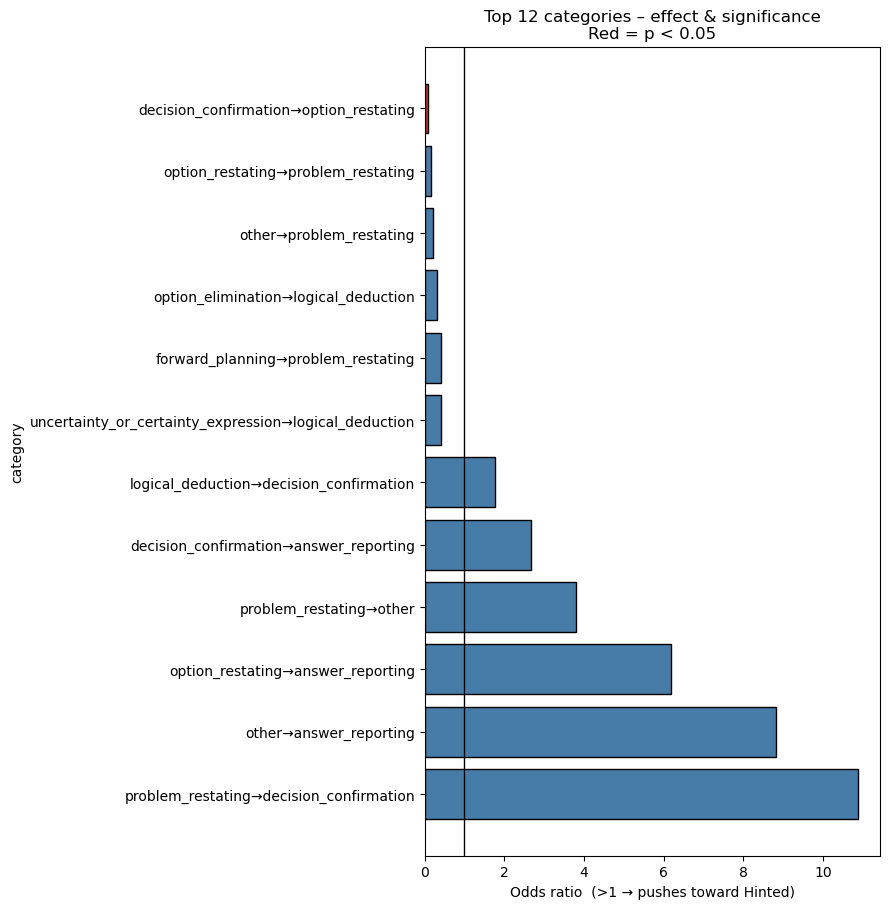


Interpretation:
• Each extra 'problem_restating→decision_confirmation' sentence multiplies the odds of being Hinted by 10.88 (p = 0.235, non-significant) → more likely Hinted.
• Each extra 'other→answer_reporting' sentence multiplies the odds of being Hinted by 8.82 (p = 0.146, non-significant) → more likely Hinted.
• Each extra 'option_restating→answer_reporting' sentence multiplies the odds of being Hinted by 6.18 (p = 0.196, non-significant) → more likely Hinted.
• Each extra 'problem_restating→other' sentence multiplies the odds of being Hinted by 3.80 (p = 0.263, non-significant) → more likely Hinted.
• Each extra 'decision_confirmation→answer_reporting' sentence multiplies the odds of being Hinted by 2.68 (p = 0.266, non-significant) → more likely Hinted.
• Each extra 'logical_deduction→decision_confirmation' sentence multiplies the odds of being Hinted by 1.78 (p = 0.258, non-significant) → more likely Hinted.
• Each extra 'uncertainty_or_certainty_expression→logical_deduction'

In [19]:
# ────────────────────────────────────────────────────────────────────────────────
# Robust significance analysis for category coefficients
#   • drops constant columns
#   • tries plain Logit, falls back to ridge-penalised GLM
#   • always produces SE, z, p-value, 95 % CI, odds-ratios and a clear plot
# ────────────────────────────────────────────────────────────────────────────────
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import statsmodels.api as sm
from numpy.linalg import LinAlgError
from scipy.stats import norm          # <-- NEW (for two-sided p-values)

# ---------------------------------------------------------------- 1) prune zero-variance columns
mask_var   = (X.toarray().var(axis=0) > 0)          # True ⇒ keep
X_keep     = X[:, mask_var].toarray()               # dense for statsmodels
feat_keep  = feature_names[mask_var]

X_sm = sm.add_constant(X_keep, has_constant="add")  # intercept

print(f"Original features: {len(feature_names)}   |   Kept after pruning: {len(feat_keep)}")

# ---------------------------------------------------------------- 2) fit model (Logit → fallback ridge-GLM)
try:
    model   = sm.Logit(y, X_sm)
    results = model.fit(disp=False)
    method  = "Plain MLE Logit"
except (LinAlgError, ValueError):
    print("Plain Logit failed (singular / separation) → switching to ridge-penalised GLM")
    model   = sm.GLM(y, X_sm, family=sm.families.Binomial())
    results = model.fit_regularized(alpha=1e-4, L1_wt=0.0, maxiter=1000)
    method  = "Ridge-penalised GLM"
print(f"Fit completed with: {method}")

# ---------------------------------------------------------------- 3) covariance / significance
params = results.params[1:]                          # drop intercept

if hasattr(results, "cov_params"):
    cov = results.cov_params()[1:, 1:]               # built-in (Logit path)
else:
    # Ridge path – compute penalised Fisher information manually
    alpha = 1e-4                                     # keep in sync with fit_regularized
    mu    = results.predict()                        # fitted probs (N,)
    W     = np.diag(mu * (1 - mu))                   # N×N  (N≈400 → fine)
    XtWX  = X_sm.T @ W @ X_sm
    cov_full = np.linalg.inv(XtWX + 2*alpha*np.eye(X_sm.shape[1]))
    cov = cov_full[1:, 1:]                           # drop intercept

se     = np.sqrt(np.diag(cov))
z      = params / se
pval   = 2 * (1 - norm.cdf(np.abs(z)))               # two-sided
ci_lo  = params - 1.96 * se
ci_hi  = params + 1.96 * se

odds   = np.exp(params)
or_lo  = np.exp(ci_lo)
or_hi  = np.exp(ci_hi)

stats_df = (pd.DataFrame({
                "category":   feat_keep,
                "coef":       params,
                "SE":         se,
                "z":          z,
                "p_value":    pval,
                "odds_ratio": odds,
                "or_low":     or_lo,
                "or_high":    or_hi})
            .sort_values("p_value"))

display(stats_df.style.format({"coef":"{:+.3f}", "SE":"{:.3f}",
                               "z":"{:+.2f}",  "p_value":"{:.3g}",
                               "odds_ratio":"{:.2f}", "or_low":"{:.2f}", "or_high":"{:.2f}"}))

TOP_N   = 12
SIG_CUT = 0.05

plot_df = (stats_df.assign(abs_z=lambda d: np.abs(d.z))
                    .sort_values("abs_z", ascending=False)
                    .head(TOP_N)
                    .sort_values("odds_ratio"))

plt.figure(figsize=(9, 5 + 0.35*TOP_N))
palette = ["#e41a1c" if p < SIG_CUT else "#377eb8" for p in plot_df.p_value]

ax = sns.barplot(x="odds_ratio", y="category",
                 data=plot_df, palette=palette, orient="h", edgecolor="k")
ax.errorbar(x=plot_df.or_low,  y=np.arange(TOP_N),
            xerr=None, fmt="none", ecolor="k", capsize=3)
ax.errorbar(x=plot_df.or_high, y=np.arange(TOP_N),
            xerr=None, fmt="none", ecolor="k", capsize=3)

ax.axvline(1, color="k", lw=1)
ax.set_xlabel("Odds ratio  (>1 → pushes toward Hinted)")
ax.set_title(f"Top {TOP_N} categories – effect & significance\nRed = p < {SIG_CUT}")
plt.tight_layout()
plt.show()

print("\nInterpretation:")
for _, r in plot_df[::-1].iterrows():
    sig  = "significant" if r.p_value < SIG_CUT else "non-significant"
    dirn = "more likely Hinted" if r.coef > 0 else "more likely Unhinted"
    print(f"• Each extra '{r.category}' sentence multiplies the odds of being "
          f"Hinted by {r.odds_ratio:.2f} (p = {r.p_value:.3g}, {sig}) → {dirn}.")


Fit completed with: Plain MLE Logit


,category,coef,SE,z,p_value,odds_ratio,or_low,or_high
1,assumption_validation,+0.155,0.090,+1.73,0.0842,1.17,0.98,1.39
8,option_restating,+0.061,0.047,+1.31,0.191,1.06,0.97,1.16
4,forward_planning,-0.120,0.094,-1.28,0.2,0.89,0.74,1.07
0,answer_reporting,+0.125,0.132,+0.94,0.345,1.13,0.87,1.47
6,logical_deduction,-0.016,0.017,-0.94,0.347,0.98,0.95,1.02
10,problem_restating,-0.039,0.043,-0.91,0.363,0.96,0.88,1.05
7,option_elimination,-0.052,0.061,-0.85,0.397,0.95,0.84,1.07
2,backtracking,-0.065,0.093,-0.70,0.485,0.94,0.78,1.12
11,uncertainty_or_certainty_expression,-0.018,0.032,-0.56,0.577,0.98,0.92,1.05
9,other,+0.016,0.032,+0.51,0.608,1.02,0.95,1.08


/tmp/ipykernel_65760/186623120.py:63: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




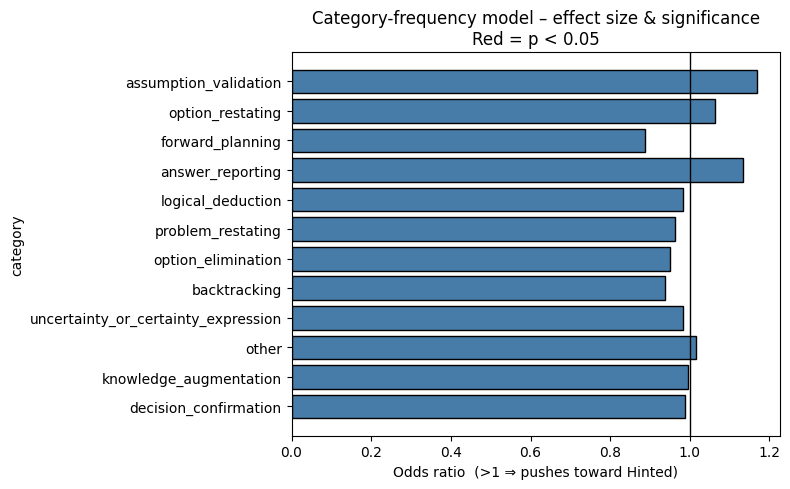


Interpretation:
  • assumption_validation: OR = 1.17 (p = 0.0842, non-significant) → more likely Hinted
  • option_restating: OR = 1.06 (p = 0.191, non-significant) → more likely Hinted
  • forward_planning: OR = 0.89 (p = 0.2, non-significant) → more likely Unhinted
  • answer_reporting: OR = 1.13 (p = 0.345, non-significant) → more likely Hinted
  • logical_deduction: OR = 0.98 (p = 0.347, non-significant) → more likely Unhinted
  • problem_restating: OR = 0.96 (p = 0.363, non-significant) → more likely Unhinted
  • option_elimination: OR = 0.95 (p = 0.397, non-significant) → more likely Unhinted
  • backtracking: OR = 0.94 (p = 0.485, non-significant) → more likely Unhinted
  • uncertainty_or_certainty_expression: OR = 0.98 (p = 0.577, non-significant) → more likely Unhinted
  • other: OR = 1.02 (p = 0.608, non-significant) → more likely Hinted
  • knowledge_augmentation: OR = 1.00 (p = 0.845, non-significant) → more likely Unhinted
  • decision_confirmation: OR = 0.99 (p = 0.88, n

In [ ]:
# ────────────────────────────────────────────────────────────────────────────────
# Significance levels for the CATEGORY-FREQUENCY logistic regression
# ────────────────────────────────────────────────────────────────────────────────
import numpy as np, pandas as pd, seaborn as sns, matplotlib.pyplot as plt
import statsmodels.api as sm
from scipy.stats import norm
from numpy.linalg import LinAlgError

# ---------------------------------------------------------------- 1.  set up design matrix
X_dense    = X.toarray()                                # (N × 12)
X_sm       = sm.add_constant(X_dense, has_constant="add")
feat_names = feature_names                              # exactly the 12 category labels

# ---------------------------------------------------------------- 2.  fit (Logit → ridge fallback)
try:
    res = sm.Logit(y, X_sm).fit(disp=False)
    method = "Plain MLE Logit"
except (LinAlgError, ValueError):
    print("Plain Logit failed → using ridge-penalised GLM")
    res = sm.GLM(y, X_sm, family=sm.families.Binomial()) \
            .fit_regularized(alpha=1e-4, L1_wt=0.0, maxiter=1000)
    method = "Ridge-penalised GLM"
print("Fit completed with:", method)

# ---------------------------------------------------------------- 3.  extract stats
β     = res.params[1:]                                   # drop intercept
if hasattr(res, "cov_params"):
    cov = res.cov_params()[1:, 1:]
else:                                                    # ridge path – manual Fisher
    α   = 1e-4
    μ   = res.predict()
    W   = np.diag(μ * (1 - μ))
    XtWX = X_sm.T @ W @ X_sm + 2*α*np.eye(X_sm.shape[1])
    cov  = np.linalg.inv(XtWX)[1:, 1:]

SE    = np.sqrt(np.diag(cov))
z     = β / SE
pval  = 2 * (1 - norm.cdf(np.abs(z)))                    # two-sided
OR    = np.exp(β)
ci_lo = np.exp(β - 1.96*SE)
ci_hi = np.exp(β + 1.96*SE)

stats_df = (pd.DataFrame({
                "category":   feat_names,
                "coef":       β,
                "SE":         SE,
                "z":          z,
                "p_value":    pval,
                "odds_ratio": OR,
                "or_low":     ci_lo,
                "or_high":    ci_hi})
            .sort_values("p_value"))

display(stats_df.style.format({
        "coef":"{:+.3f}", "SE":"{:.3f}", "z":"{:+.2f}", "p_value":"{:.3g}",
        "odds_ratio":"{:.2f}", "or_low":"{:.2f}", "or_high":"{:.2f}"}))

# ---------------------------------------------------------------- 4.  visual summary
SIG_CUT = 0.05
plt.figure(figsize=(8, 5))
palette = ["#e41a1c" if p < SIG_CUT else "#377eb8" for p in stats_df.p_value]

sns.barplot(x="odds_ratio", y="category", data=stats_df,
            palette=palette, orient="h", edgecolor="k")
plt.errorbar(x=stats_df.or_low,  y=np.arange(len(stats_df)),
             xerr=None, fmt="none", ecolor="k", capsize=3)
plt.errorbar(x=stats_df.or_high, y=np.arange(len(stats_df)),
             xerr=None, fmt="none", ecolor="k", capsize=3)
plt.axvline(1, color="k", lw=1)
plt.xlabel("Odds ratio  (>1 ⇒ pushes toward Hinted)")
plt.title("Category-frequency model – effect size & significance\nRed = p < 0.05")
plt.tight_layout()
plt.show()

# ---------------------------------------------------------------- 5.  quick prose summary
print("\nInterpretation:")
for _, r in stats_df.iterrows():
    signif = "SIGNIFICANT" if r.p_value < SIG_CUT else "non-significant"
    direction = "more likely Hinted" if r.coef > 0 else "more likely Unhinted"
    print(f"  • {r.category}: OR = {r.odds_ratio:.2f} "
          f"(p = {r.p_value:.3g}, {signif}) → {direction}")


Dataset: 400 questions  |  66.8 non-zero feats / instance (avg)
              precision    recall  f1-score   support

    Unhinted      0.512     0.520     0.516       200
      Hinted      0.513     0.505     0.509       200

    accuracy                          0.512       400
   macro avg      0.513     0.512     0.512       400
weighted avg      0.513     0.512     0.512       400

ROC-AUC: 0.527


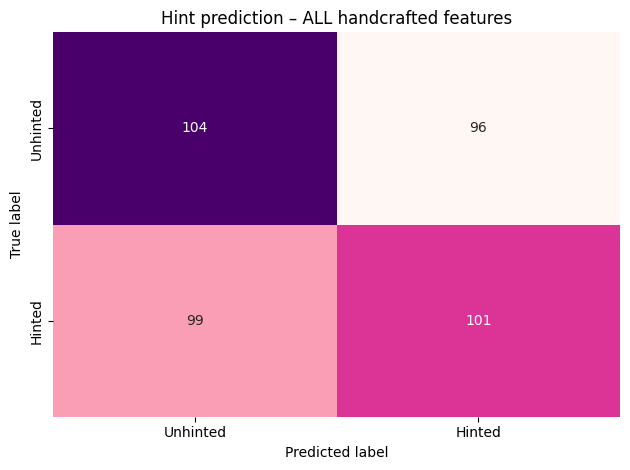

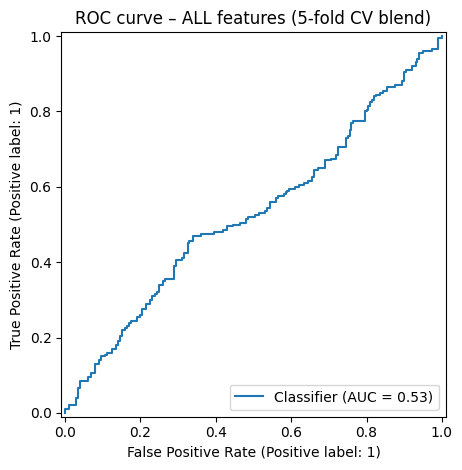

,feature,coef,abs_coef
117,BIGRAM::problem_restating→knowledge_augmentation,1.368026,1.368026
132,BIGRAM::uncertainty_or_certainty_expression→op...,-1.213117,1.213117
29,BIGRAM::backtracking→uncertainty_or_certainty_...,1.094798,1.094798
27,BIGRAM::backtracking→other,1.050774,1.050774
225,TRANS::logical_deduction→answer_reporting,-0.934352,0.934352
259,TRANS::option_restating→problem_restating,-0.912255,0.912255
93,BIGRAM::option_restating→knowledge_augmentation,0.900384,0.900384
223,TRANS::knowledge_augmentation→problem_restating,-0.869666,0.869666
37,BIGRAM::decision_confirmation→option_restating,-0.866283,0.866283
291,TRANS::uncertainty_or_certainty_expression→log...,-0.842131,0.842131


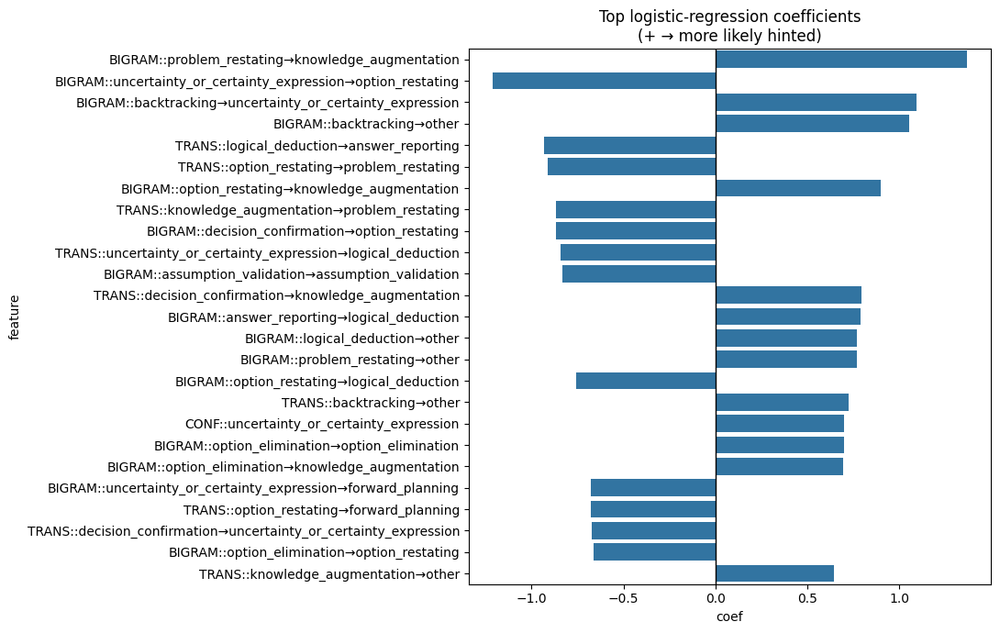

In [ ]:
# ────────────────────────────────────────────────────────────────────────────────
# ALL-feature logistic regression  (robust: redeclares missing helpers)
# ────────────────────────────────────────────────────────────────────────────────
from collections import Counter, defaultdict
from itertools import pairwise
from sklearn.feature_extraction import DictVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold, cross_val_predict
from sklearn.metrics import (classification_report, confusion_matrix,
                             roc_auc_score, RocCurveDisplay)

# ---------------------------------------------------------------- redeclare ---
try:
    build_feature_vector
except NameError:
    def build_feature_vector(annots, *, use_bigrams=True):
        """Counts category unigrams (+ optional bigram flags) and seq length."""
        cats = [top_category_per_sentence(s)
                for s in sorted(annots, key=lambda s: s["sentence_id"])]
        cats = [c for c in cats if c]

        feats = Counter(cats)                                 # unigram counts
        if use_bigrams and len(cats) > 1:                     # binary bigrams
            feats.update({f"BIGRAM::{a}→{b}": 1
                          for a, b in pairwise(cats)})

        feats["SEQ_LEN"] = len(cats)
        return feats

# ---------------------------------------------------------------- utilities ---
def build_transition_features(annots, *, include_self=True):
    feats = Counter()
    ordered = sorted(annots, key=lambda s: s["sentence_id"])
    cats    = [top_category_per_sentence(s) for s in ordered]
    cats    = [c for c in cats if c]

    for a, b in pairwise(cats):
        if not include_self and a == b:
            continue
        feats[f"TRANS::{a}→{b}"] += 1
    return feats


def build_confidence_features(annots):
    conf = defaultdict(float)
    for sent in annots:
        for cat, val in sent.items():
            if cat in CATEGORIES and val > 0.0:
                conf[f"CONF::{cat}"] += val
    return conf


def build_all_features(annots):
    feats = Counter()

    # 1. Unigram counts (+ bigrams + seq length)
    feats.update(build_feature_vector(annots, use_bigrams=True))

    # 2. Presence flags
    for cat in CATEGORIES:
        feats[f"PRES::{cat}"] = int(any(
            top_category_per_sentence(s) == cat for s in annots))

    # 3. Transition counts
    feats.update(build_transition_features(annots, include_self=True))

    # 4. Confidence sums
    feats.update(build_confidence_features(annots))

    return feats

# ----------------------------------------------------------- build dataset ----
X_dict, y = [], []
for data, label in [(unhinted_data, 0), (hinted_data, 1)]:
    for q in data:
        X_dict.append(build_all_features(q["annotations"]))
        y.append(label)

print(f"Dataset: {len(X_dict)} questions  |  "
      f"{sum(map(len, X_dict))/len(X_dict):.1f} non-zero feats / instance (avg)")

vec = DictVectorizer(sparse=True)
X   = vec.fit_transform(X_dict)
feature_names = vec.get_feature_names_out()

# -------------------------------------------------- train / cross-validate ----
clf = LogisticRegression(penalty="l2", C=1.0,
                         solver="liblinear", max_iter=1000)

cv      = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
y_pred  = cross_val_predict(clf, X, y, cv=cv, method="predict")
y_proba = cross_val_predict(clf, X, y, cv=cv, method="predict_proba")[:, 1]

print(classification_report(y, y_pred,
                            target_names=["Unhinted", "Hinted"],
                            digits=3))
print(f"ROC-AUC: {roc_auc_score(y, y_proba):.3f}")

cm = confusion_matrix(y, y_pred)
sns.heatmap(cm, annot=True, fmt="d", cmap="RdPu", cbar=False,
            xticklabels=["Unhinted", "Hinted"],
            yticklabels=["Unhinted", "Hinted"])
plt.title("Hint prediction – ALL handcrafted features")
plt.ylabel("True label"); plt.xlabel("Predicted label")
plt.tight_layout()
plt.show()

RocCurveDisplay.from_predictions(y, y_proba)
plt.title("ROC curve – ALL features (5-fold CV blend)")
plt.tight_layout()
plt.show()

# -------------------------------------------------------- coefficient view ----
clf_full = LogisticRegression(penalty="l2", C=1.0,
                              solver="liblinear", max_iter=1000)
clf_full.fit(X, y)

coef_df = (pd.DataFrame({"feature": feature_names,
                         "coef":    clf_full.coef_.ravel()})
           .assign(abs_coef=lambda d: d.coef.abs())
           .sort_values("abs_coef", ascending=False))

display(coef_df.head(25))

plt.figure(figsize=(11, 7))
sns.barplot(x="coef", y="feature",
            data=coef_df.head(25), orient="h")
plt.axvline(0, color="k", lw=1)
plt.title("Top logistic-regression coefficients\n(+ → more likely hinted)")
plt.tight_layout()
plt.show()
